# CAP 781 
# Machine Learning
#  Unit - 4: **Image Processing Fundamentals**

## Author

- **Name**: `Tanzeela Javid Kaloo` | `Assistant Professor`
- **Department**: Systems and Architecture
- **University**: Lovely Professional University
- **Email**: tanzeela.jvd@gmail.com

## Understanding Images in Computers

### What is an Image?
An image is a collection of **pixels** (picture elements) arranged in a grid. Each pixel contains **intensity values** that determine the brightness or color of the image.

### Types of Images
| Type                 | Description |
|----------------------|-------------|
| **Grayscale**       | Each pixel has an intensity value (0-255). |
| **RGB (Color)**     | Each pixel has 3 values: Red, Green, and Blue (0-255 each). |
| **Binary (Black & White)** | Pixels are either black (0) or white (255). |
| **Indexed**         | Uses a colormap where each pixel represents an index to a color. |

### Pixels and Resolution
- A **pixel** is the smallest unit of an image.
- **Higher resolution** = more pixels = more details.
- Example: **1920×1080 (Full HD)** means **1920 pixels wide** and **1080 pixels high**.

### Image File Formats
| Format  | Description |
|---------|-------------|
| **JPEG** | Compressed format, used for photography. |
| **PNG**  | Lossless compression, supports transparency. |
| **BMP**  | Uncompressed, large file size. |
| **TIFF** | Used in professional imaging applications. |


## **Loading Images using OpenCV and Pillow**
We’re going to **break down the image loading and visualization workflow** in OpenCV and Pillow. Understanding how images are represented in these libraries is **crucial** because different libraries handle colors differently. If we don’t handle this correctly, we might **misinterpret colors**, which can lead to problems in image processing applications.  

### **Loading an Image with OpenCV (`cv2.imread()`)**  

In [1]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Load image using OpenCV
image_cv = cv2.imread("images/lena.jpg")  # Loads the image as BGR

It **does NOT load the image in RGB format**. Instead, OpenCV stores images in **BGR (Blue-Green-Red) order**.  

**Why does OpenCV use BGR instead of RGB?**  
- This is mainly for **historical reasons**. When OpenCV was developed, BGR ordering was **faster for processing on older hardware**.  
- However, most modern libraries and visualization tools (like **Matplotlib**) expect **RGB format**, which can cause **color mismatches** when displaying images.  

**Problem:** If we directly display an OpenCV-loaded image in Matplotlib, the colors will appear **incorrect (blue might look red, and vice versa).**  

### **Converting BGR to RGB (`cv2.cvtColor()`)**  

To **correct the color mismatch**, we need to **convert the BGR image to RGB** before displaying it using Matplotlib. This is done using:  

In [2]:
image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for visualization

 
**Why do we need this conversion?**  
- Matplotlib assumes that images are **in RGB format**, so if we pass an OpenCV image **without conversion**, the colors will look **wrong**.  
- **This step is necessary** for correct visualization.

### **Loading an Image with Pillow (`Image.open()`)**  

Unlike OpenCV, Pillow loads images **directly in RGB format**:  

In [3]:
# Load image using Pillow (RGB )
image_pil = Image.open("images/lena.jpg") # Loads the image as RGB

  
**Why is this important?**  
- If you're working with **image editing or deep learning**, using **Pillow may be easier** because it doesn’t require **BGR to RGB conversion**.  
- Pillow’s `Image.open()` method loads the image in the **same color format as expected by Matplotlib**, making visualization **simpler and more intuitive**.

### **Displaying Images with Matplotlib (`plt.imshow()`)**  

Display three versions of the image:  

1. **BGR-loaded image (from OpenCV) → Appears incorrect in Matplotlib**  
2. **Converted RGB image (from OpenCV) → Displays correctly in Matplotlib**  
3. **Pillow-loaded image → Displays correctly without extra conversion**  

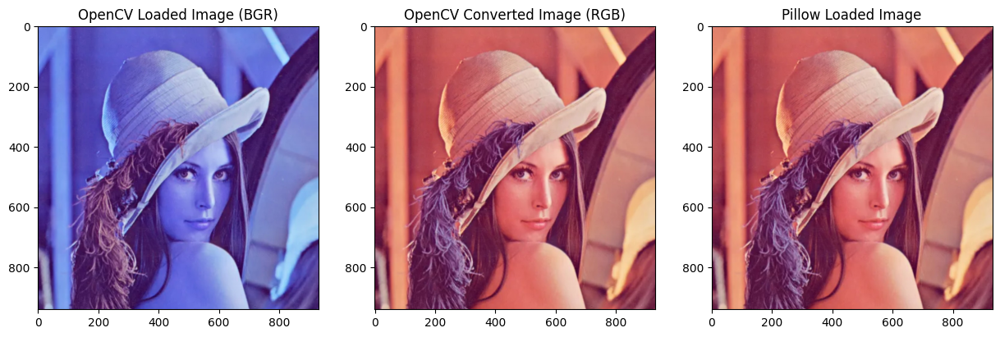

In [4]:
fig, axes = plt.subplots(1, 3, figsize=(15, 8))

axes[0].imshow(image_cv)  # Incorrect BGR visualization
axes[0].set_title("OpenCV Loaded Image (BGR)")

axes[1].imshow(image_rgb)  # Corrected RGB image
axes[1].set_title("OpenCV Converted Image (RGB)")

axes[2].imshow(image_pil)  # Pillow's correctly loaded image
axes[2].set_title("Pillow Loaded Image")

plt.show()

- **Always convert OpenCV images from BGR to RGB before displaying with Matplotlib!**  
- **Pillow loads images in RGB directly, so no conversion is needed.**  

### **Why Does This Matter in Image Processing?**
- **Prevents color misinterpretation** when working with OpenCV.  
- **Ensures accurate visualization** when displaying images for debugging.  
- **Essential for deep learning applications**, where incorrect colors can affect model predictions.  
- **Improves consistency** across different image processing libraries.  

Image Properties:
Type: <class 'numpy.ndarray'>
Shape (Height, Width, Channels): (183, 275, 3)
Data Type: uint8

 Pixel Value at (50, 100): [123   5   0]
Image Statistics:
Max Pixel Value: 255
Min Pixel Value: 0
Mean Pixel Value: 64.22639509852624
Standard Deviation: 91.97446069177674


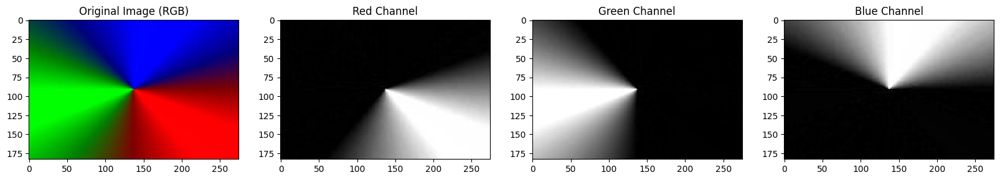

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image (Original OpenCV BGR format)
# image_cv = cv2.imread("images/lena.jpg") 
image_cv = cv2.imread("images/rgb.jpeg") 


# Check if image is loaded
if image_cv is None:
    print("Error: Image not found. Check the file path.")
else:
    # 1. Check Image Properties
    print("Image Properties:")
    print("Type:", type(image_cv))
    print("Shape (Height, Width, Channels):", image_cv.shape)  # (H, W, C)
    print("Data Type:", image_cv.dtype)

    # 2. Access a Specific Pixel
    pixel_value = image_cv[50, 100]  # BGR value at (50,100)
    print("\n Pixel Value at (50, 100):", pixel_value)

    # 3. Compute Image Statistics
    print("Image Statistics:")
    print("Max Pixel Value:", np.max(image_cv))
    print("Min Pixel Value:", np.min(image_cv))
    print("Mean Pixel Value:", np.mean(image_cv))
    print("Standard Deviation:", np.std(image_cv))

    # 4. Convert BGR to RGB for Display
    image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)

    # 5. Extract and Display Each Color Channel
    red, green, blue = cv2.split(image_rgb)

    # Display Original Image & Channels
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    axes[0].imshow(image_rgb)  
    axes[0].set_title("Original Image (RGB)")

    axes[1].imshow(red, cmap="gray")
    axes[1].set_title("Red Channel")

    axes[2].imshow(green, cmap="gray")
    axes[2].set_title("Green Channel")

    axes[3].imshow(blue, cmap="gray")
    axes[3].set_title("Blue Channel")

    plt.show()


  # # Display Original Image & Channels
  #   fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
  #   axes[0].imshow(image_rgb)  
  #   axes[0].set_title("Original Image (RGB)")

  #   axes[1].imshow(red)
  #   axes[1].set_title("Red Channel")

  #   axes[2].imshow(green)
  #   axes[2].set_title("Green Channel")

  #   axes[3].imshow(blue)
  #   axes[3].set_title("Blue Channel")

  #   plt.show()

##  Understanding Image Statistics for Individual Color Channels

When analyzing an image, each color channel (Red, Green, Blue) can have different intensity distributions. These statistics help us understand brightness, contrast, and color dominance in an image.

## Compute Image Statistics for `Red` Channel

In [6]:
    print("Image Statistics of Red Channel:")
    print("Max Pixel Value:", np.max(red))
    print("Min Pixel Value:", np.min(red))
    print("Mean Pixel Value:", np.mean(red))
    print("Standard Deviation:", np.std(red))

Image Statistics of Red Channel:
Max Pixel Value: 255
Min Pixel Value: 0
Mean Pixel Value: 64.4179433681073
Standard Deviation: 95.29047894719527


- Max Pixel Value (255) → There are areas in the image where red is fully saturated.
- Min Pixel Value (55) → Unlike green (which had 0), red is never completely absent from the image.
- Mean Pixel Value (180.51) → This is the highest mean value among all channels, suggesting that the image has a strong red component.
- Standard Deviation (48.76) → High variation, meaning some areas are rich in red while others have much less.

## Compute Image Statistics for `Green` Channel

In [7]:
    print("Image Statistics of Green Channel:")
    print("Max Pixel Value:", np.max(green))
    print("Min Pixel Value:", np.min(green))
    print("Mean Pixel Value:", np.mean(green))
    print("Standard Deviation:", np.std(green))

Image Statistics of Green Channel:
Max Pixel Value: 255
Min Pixel Value: 0
Mean Pixel Value: 63.90104321907601
Standard Deviation: 90.51497741543804


- Max Pixel Value (238) → The brightest green in the image is close to the maximum (255).
- Min Pixel Value (0) → Some pixels contain no green at all.
- Mean Pixel Value (99.27) → The average green intensity is relatively low, meaning the image is not dominated by green.
- Standard Deviation (52.14) → Higher standard deviation than the blue channel, meaning green varies significantly across the image.

## Compute Image Statistics for `Blue` Channel

In [8]:
    print("Image Statistics of Blue Channel:")
    print("Max Pixel Value:", np.max(blue))
    print("Min Pixel Value:", np.min(blue))
    print("Mean Pixel Value:", np.mean(blue))
    print("Standard Deviation:", np.std(blue))

Image Statistics of Blue Channel:
Max Pixel Value: 255
Min Pixel Value: 0
Mean Pixel Value: 64.36019870839543
Standard Deviation: 90.02503705156349


- Max Pixel Value (223) → The brightest blue in the image is almost at full intensity (255 is the max possible value).
- Min Pixel Value (28) → The darkest blue pixel has a low intensity but is not completely black (0).
- Mean Pixel Value (105.57) → On average, the blue intensity is mid-range, meaning the image has some blue, but it is not dominant.
- Standard Deviation (33.63) → Moderate variation in blue intensity, meaning blue is somewhat spread across the image but not uniformly.
- 
## How This Helps in Image Processing
1. Helps in color-based segmentation (detecting dominant colors).
2. Useful for image enhancement (adjusting contrast and brightness per channel).
3. Can be applied in machine learning & deep learning for color-based object detection.



## Histograms in Image Processing

A histogram is a graphical representation of the pixel intensity distribution in an image. It shows: 
1. How many pixels have a certain intensity value (0-255).
2. Whether an image is bright, dark, or well-balanced.
3. How colors are distributed across the image.
## Visualizing Histograms for Red, Green, and Blue Channels

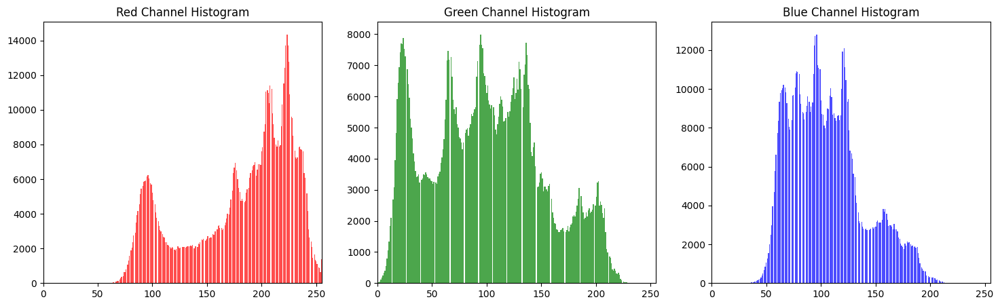

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_cv = cv2.imread("images/lena.jpg") 

# Convert BGR to RGB for correct visualization
image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)

# Split channels
red, green, blue = cv2.split(image_rgb)

# Create histogram plots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Red Channel Histogram
axes[0].hist(red.ravel(), bins=256, color='red', alpha=0.7)
axes[0].set_title("Red Channel Histogram")
axes[0].set_xlim([0, 255])

# Green Channel Histogram
axes[1].hist(green.ravel(), bins=256, color='green', alpha=0.7)
axes[1].set_title("Green Channel Histogram")
axes[1].set_xlim([0, 255])

# Blue Channel Histogram
axes[2].hist(blue.ravel(), bins=256, color='blue', alpha=0.7)
axes[2].set_title("Blue Channel Histogram")
axes[2].set_xlim([0, 255])

plt.show()


## What These Histograms Show
- Red Channel Histogram → High peaks at higher intensity values (suggests a dominant red tone in the image).
- Green Channel Histogram → More evenly distributed but with some darker values (green is present but not as strong).
- Blue Channel Histogram → Mostly concentrated in mid-range to lower values (less blue dominance).

## Convert Image to Grayscale (Single-Channel)
If the image is grayscale, each pixel has only one intensity value (0-255).

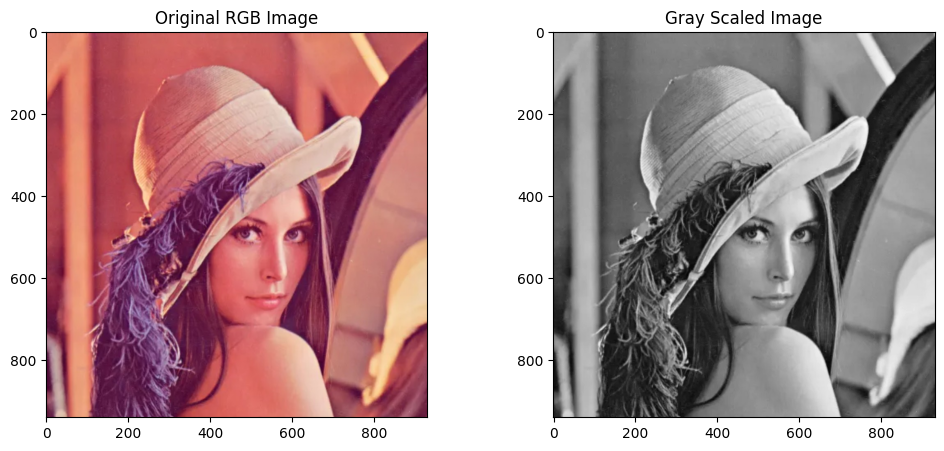

In [10]:
# Load the image
image_cv = cv2.imread("images/lena.jpg") 

# Convert BGR to RGB for correct visualization
image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)

# Convert to grayscale
gray_image = cv2.cvtColor(image_cv, cv2.COLOR_BGR2GRAY)

# Display original and equalized images
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(image_rgb)
axes[0].set_title("Original RGB Image")

axes[1].imshow(gray_image, cmap ='gray')
axes[1].set_title("Gray Scaled Image")

plt.show()

## Histogram of Gray Scaled Image

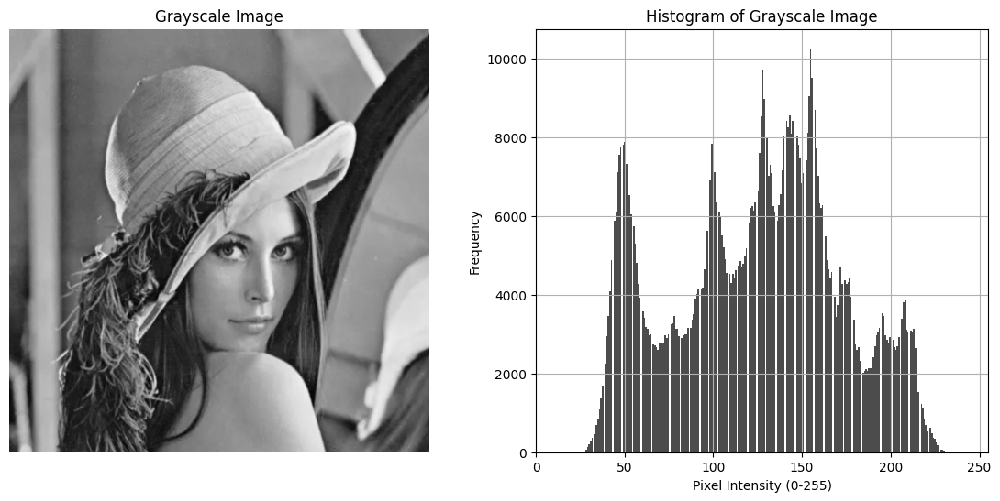

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image (Ensure the correct path)
image_path = "images/lena.jpg"  # Adjust if needed
image_cv = cv2.imread(image_path)

# Convert image to grayscale
gray_image = cv2.cvtColor(image_cv, cv2.COLOR_BGR2GRAY)

# Compute the histogram of the grayscale image
histogram, bins = np.histogram(gray_image.flatten(), bins=256, range=[0, 256])

# Create subplots for grayscale image and its histogram
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Display the grayscale image
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title("Grayscale Image")
axes[0].axis("off")

# Display the histogram
axes[1].hist(gray_image.ravel(), bins=256, color='black', alpha=0.7)
axes[1].set_title("Histogram of Grayscale Image")
axes[1].set_xlabel("Pixel Intensity (0-255)")
axes[1].set_ylabel("Frequency")
axes[1].set_xlim([0, 255])
axes[1].grid()

# Show the plots
plt.show()


## Image Normalization

**Why is the Pixel Intensity Normalized Between 0 and 255?**

In image processing, normalization is used to adjust the pixel intensity values to a specific range. The most common range used is 0 to 255, because:

1. Digital images typically use 8-bit representation → Each pixel value is stored in 8 bits, which means it can take values from 0 to 255.
    - 0 represents black (minimum intensity).
    - 255 represents white (maximum intensity).
    - Values in between represent different shades of gray.
2. Consistency with Image Processing Libraries → Most libraries like OpenCV, Pillow, and Matplotlib process grayscale and color images in this range.

3. Maintains the Image Structure → If normalization is performed without scaling to 0-255, images might lose contrast and details when displayed.
 
##  How Normalization Works
**Formula for Min-Max Normalization**:
$$ 
I_{\text{normalized}} = \frac{I_{\text{original}} - I_{\text{min}}}{I_{\text{max}} - I_{\text{min}}} \times 255
 $$
Where:
- $  I_{\text{original}} $ = Pixel intensity in the original image.
- $ I_{\text{min}} $ = Minimum pixel intensity in the image.
- $ I_{\text{max}} $ = Maximum pixel intensity in the image.
- $ 255 $ = Maximum value in the 8-bit image scale.

###  Example
**Before Normalization:**  
Suppose an image has pixel values ranging from **30 to 200** (instead of 0 to 255).  
After applying **min-max normalization**, all values are **scaled to fit within 0-255**:
- The darkest pixel (30) becomes **0**.
- The brightest pixel (200) becomes **255**.
- All other values are proportionally mapped between **0 and 255**.

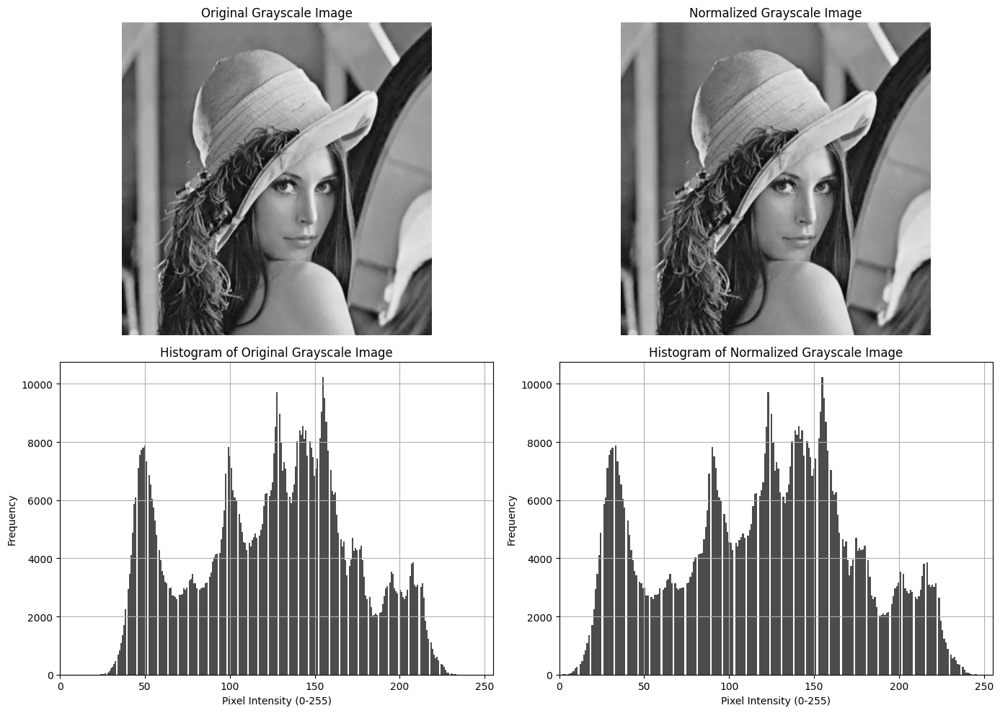

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image (Ensure the correct path)
image_path = "images/lena.jpg"  # Adjust if needed
image_cv = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Load as grayscale

# Normalize the grayscale image (Min-Max Normalization)
normalized_gray = cv2.normalize(image_cv, None, 0, 255, cv2.NORM_MINMAX)

# Compute histograms
hist_gray, bins_gray = np.histogram(image_cv.flatten(), bins=256, range=[0, 256])
hist_normalized, bins_normalized = np.histogram(normalized_gray.flatten(), bins=256, range=[0, 256])

# Create subplots for grayscale and normalized images along with their histograms
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Display the original grayscale image
axes[0, 0].imshow(image_cv, cmap='gray')
axes[0, 0].set_title("Original Grayscale Image")
axes[0, 0].axis("off")

# Display the normalized grayscale image
axes[0, 1].imshow(normalized_gray, cmap='gray')
axes[0, 1].set_title("Normalized Grayscale Image")
axes[0, 1].axis("off")

# Display the histogram of the original grayscale image
axes[1, 0].hist(image_cv.ravel(), bins=256, color='black', alpha=0.7)
axes[1, 0].set_title("Histogram of Original Grayscale Image")
axes[1, 0].set_xlabel("Pixel Intensity (0-255)")
axes[1, 0].set_ylabel("Frequency")
axes[1, 0].set_xlim([0, 255])
axes[1, 0].grid()

# Display the histogram of the normalized grayscale image
axes[1, 1].hist(normalized_gray.ravel(), bins=256, color='black', alpha=0.7)
axes[1, 1].set_title("Histogram of Normalized Grayscale Image")
axes[1, 1].set_xlabel("Pixel Intensity (0-255)")
axes[1, 1].set_ylabel("Frequency")
axes[1, 1].set_xlim([0, 255])
axes[1, 1].grid()

# Show the plots
plt.tight_layout()
plt.show()


## What Happens If We Don’t Normalize to 0-255?
- If pixel values remain **between 0 and 1** (as in deep learning applications), they may appear **too dark when displayed** in OpenCV or Matplotlib.
- If values are **between an arbitrary range** (e.g., 50-180), the image may lose **contrast**.

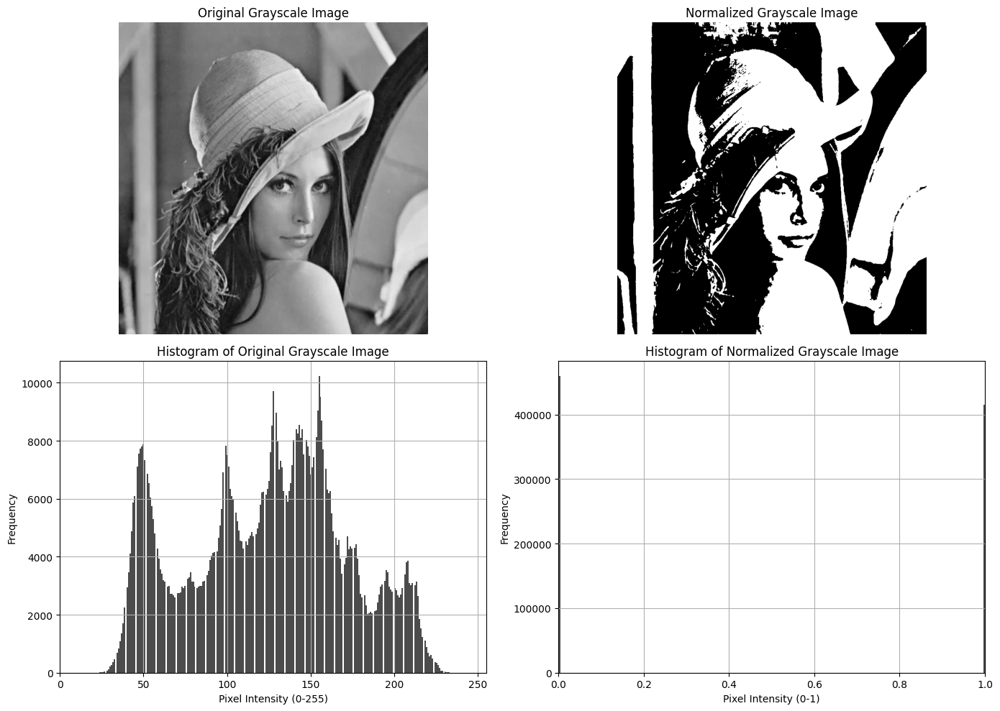

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image (Ensure the correct path)
image_path = "images/lena.jpg"  # Adjust if needed
image_cv = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Load as grayscale

# Normalize the grayscale image (Min-Max Normalization)
normalized_gray = cv2.normalize(image_cv, None, 0, 1, cv2.NORM_MINMAX)

# Compute histograms
hist_gray, bins_gray = np.histogram(image_cv.flatten(), bins=256, range=[0, 256])
hist_normalized, bins_normalized = np.histogram(normalized_gray.flatten(), range=[0, 1])

# Create subplots for grayscale and normalized images along with their histograms
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Display the original grayscale image
axes[0, 0].imshow(image_cv, cmap='gray')
axes[0, 0].set_title("Original Grayscale Image")
axes[0, 0].axis("off")

# Display the normalized grayscale image
axes[0, 1].imshow(normalized_gray, cmap='gray')
axes[0, 1].set_title("Normalized Grayscale Image")
axes[0, 1].axis("off")

# Display the histogram of the original grayscale image
axes[1, 0].hist(image_cv.ravel(), bins=256, color='black', alpha=0.7)
axes[1, 0].set_title("Histogram of Original Grayscale Image")
axes[1, 0].set_xlabel("Pixel Intensity (0-255)")
axes[1, 0].set_ylabel("Frequency")
axes[1, 0].set_xlim([0, 255])
axes[1, 0].grid()

# Display the histogram of the normalized grayscale image
axes[1, 1].hist(normalized_gray.ravel(), bins=256, color='black', alpha=0.7)
axes[1, 1].set_title("Histogram of Normalized Grayscale Image")
axes[1, 1].set_xlabel("Pixel Intensity (0-1)")
axes[1, 1].set_ylabel("Frequency")
axes[1, 1].set_xlim([0, 1])
axes[1, 1].grid()

# Show the plots
plt.tight_layout()
plt.show()


## Normalizing Colors for Better Contrast

Color normalization adjusts the intensity of an image so that pixel values spread evenly across the full range (0-255).
This helps in: 
1. Enhancing contrast, making darker and lighter regions clearer.
2. Improving color uniformity for better object detection.
   
**Normalizing RGB Image**

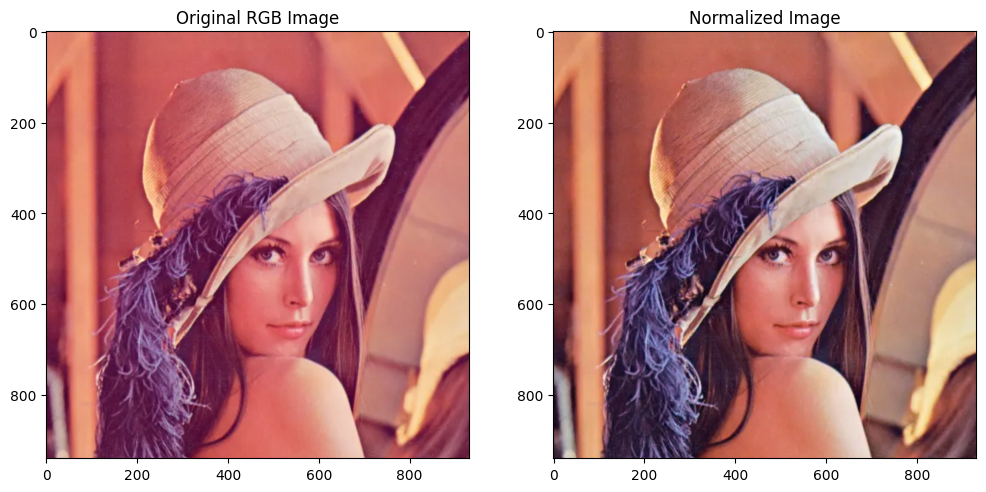

In [4]:
# Load the image
image_cv = cv2.imread("images/lena.jpg") 

# Convert BGR to RGB for correct visualization
image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)

# Split channels
red, green, blue = cv2.split(image_rgb)

# Normalize each channel separately
red_norm = cv2.normalize(red, None, 0, 255, cv2.NORM_MINMAX)
green_norm = cv2.normalize(green, None, 0, 255, cv2.NORM_MINMAX)
blue_norm = cv2.normalize(blue, None, 0, 255, cv2.NORM_MINMAX)

# Merge normalized channels back into an RGB image
normalized_image = cv2.merge((red_norm, green_norm, blue_norm))

# Display the original vs. normalized image
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(image_rgb)
axes[0].set_title("Original RGB Image")

axes[1].imshow(normalized_image.astype(np.uint8))
axes[1].set_title("Normalized Image")

plt.show()


- **The pixel intensity values are redistributed between 0 and 255.**
- **It improves visual clarity, especially in low-contrast images.**

## Histogram Equalization in Image Processing
Histogram Equalization is a contrast enhancement technique used in image processing. It redistributes the intensity values of an image so that the histogram (pixel intensity distribution) is more spread out, improving visibility in images with poor contrast.

## Why Use Histogram Equalization?
1. Real-world images often suffer from poor contrast due to low lighting, overexposure, or uneven illumination.
2. Histogram equalization enhances image details by stretching out the pixel intensity distribution across the full range of 0-255.
3. It helps in medical imaging, satellite imagery, and face recognition, where clear contrast is necessary.
   
##  How Histogram Equalization Works
Histogram equalization modifies the pixel intensities so that: 
1. Dark regions become brighter and bright regions become darker, ensuring better contrast.
2. The histogram is "flattened" to make pixel intensities more uniformly distributed.
3. The transformation is based on the Cumulative Distribution Function (CDF) of the histogram.

##  Mathematical Formula
Given an input image with **intensity values** $ I $ ranging from **0 to $ L-1 $** (where $ L=256 $ for 8-bit images):

$$
I_{\text{eq}} = \left(\frac{C(I) - C_{\min}}{M \times N - C_{\min}}\right) \times (L - 1)
$$

Where:
- $ C(I) $ is the **Cumulative Distribution Function (CDF)** of the pixel intensity.
- $ C_{\min} $ is the **minimum non-zero CDF value**.
- $ M, N $ are the **image dimensions** (height × width).
- $ I_{\text{eq}} $ is the **equalized pixel intensity**.
  
##  Visual Example: Before vs. After Histogram Equalization

**Before Equalization:**

- Image appears dark or overexposed due to narrow intensity range.
- The histogram is skewed toward dark or bright values.

**After Equalization:**

- The image has better contrast and reveals hidden details.
- The histogram is spread out, covering more intensity values.

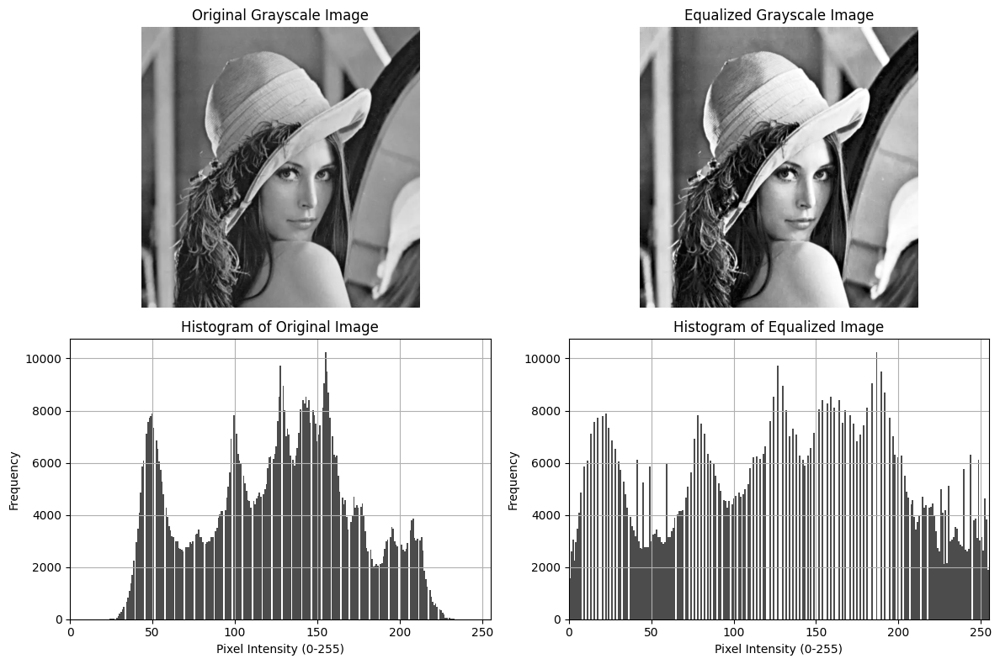

In [15]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image in grayscale
image_path = "images/lena.jpg"
gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Histogram Equalization
equalized_image = cv2.equalizeHist(gray_image)

# Plot original and equalized images along with histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

# Display the original grayscale image
axes[0, 0].imshow(gray_image, cmap='gray')
axes[0, 0].set_title("Original Grayscale Image")
axes[0, 0].axis("off")

# Display the equalized grayscale image
axes[0, 1].imshow(equalized_image, cmap='gray')
axes[0, 1].set_title("Equalized Grayscale Image")
axes[0, 1].axis("off")

# Display histogram of the original grayscale image
axes[1, 0].hist(gray_image.ravel(), bins=256, color='black', alpha=0.7)
axes[1, 0].set_title("Histogram of Original Image")
axes[1, 0].set_xlabel("Pixel Intensity (0-255)")
axes[1, 0].set_ylabel("Frequency")
axes[1, 0].set_xlim([0, 255])
axes[1, 0].grid()

# Display histogram of the equalized grayscale image
axes[1, 1].hist(equalized_image.ravel(), bins=256, color='black', alpha=0.7)
axes[1, 1].set_title("Histogram of Equalized Image")
axes[1, 1].set_xlabel("Pixel Intensity (0-255)")
axes[1, 1].set_ylabel("Frequency")
axes[1, 1].set_xlim([0, 255])
axes[1, 1].grid()

plt.tight_layout()
plt.show()


## Comparision of Normalization and Histogram Equilization on gray Scale Image

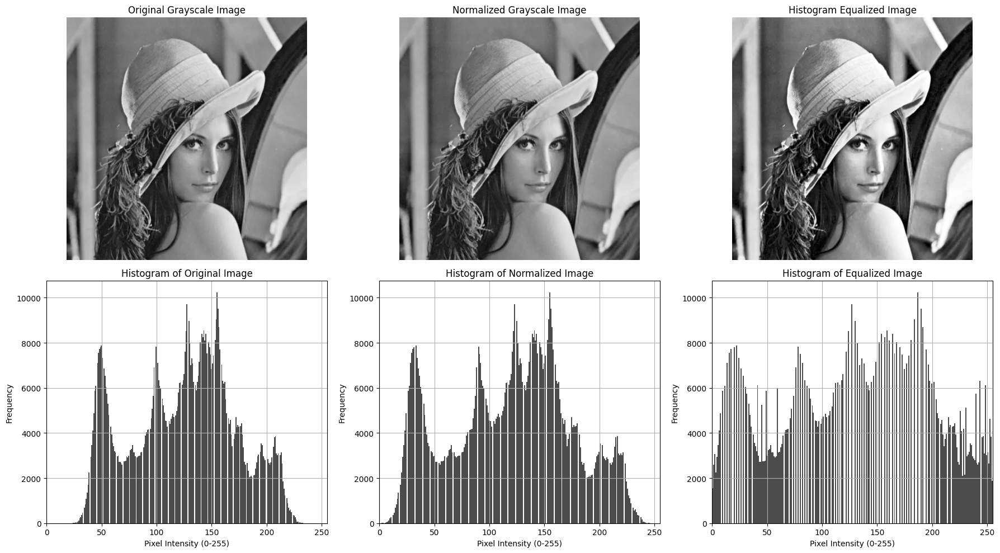

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
image_path = "images/lena.jpg"
gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Normalize the grayscale image (Min-Max Normalization)
normalized_gray = cv2.normalize(gray_image, None, 0, 255, cv2.NORM_MINMAX)

# Apply Histogram Equalization
equalized_gray = cv2.equalizeHist(gray_image)

# Compute histograms
hist_gray, _ = np.histogram(gray_image.ravel(), bins=256, range=[0, 256])
hist_normalized, _ = np.histogram(normalized_gray.ravel(), bins=256, range=[0, 256])
hist_equalized, _ = np.histogram(equalized_gray.ravel(), bins=256, range=[0, 256])

# Create subplots for original, normalized, and histogram equalized images along with their histograms
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Display the original grayscale image
axes[0, 0].imshow(gray_image, cmap='gray')
axes[0, 0].set_title("Original Grayscale Image")
axes[0, 0].axis("off")

# Display the normalized grayscale image
axes[0, 1].imshow(normalized_gray, cmap='gray')
axes[0, 1].set_title("Normalized Grayscale Image")
axes[0, 1].axis("off")

# Display the histogram equalized grayscale image
axes[0, 2].imshow(equalized_gray, cmap='gray')
axes[0, 2].set_title("Histogram Equalized Image")
axes[0, 2].axis("off")

# Display the histogram of the original grayscale image
axes[1, 0].hist(gray_image.ravel(), bins=256, color='black', alpha=0.7)
axes[1, 0].set_title("Histogram of Original Image")
axes[1, 0].set_xlabel("Pixel Intensity (0-255)")
axes[1, 0].set_ylabel("Frequency")
axes[1, 0].set_xlim([0, 255])
axes[1, 0].grid()

# Display the histogram of the normalized grayscale image
axes[1, 1].hist(normalized_gray.ravel(), bins=256, color='black', alpha=0.7)
axes[1, 1].set_title("Histogram of Normalized Image")
axes[1, 1].set_xlabel("Pixel Intensity (0-255)")
axes[1, 1].set_ylabel("Frequency")
axes[1, 1].set_xlim([0, 255])
axes[1, 1].grid()

# Display the histogram of the histogram-equalized grayscale image
axes[1, 2].hist(equalized_gray.ravel(), bins=256, color='black', alpha=0.7)
axes[1, 2].set_title("Histogram of Equalized Image")
axes[1, 2].set_xlabel("Pixel Intensity (0-255)")
axes[1, 2].set_ylabel("Frequency")
axes[1, 2].set_xlim([0, 255])
axes[1, 2].grid()

# Show the plots
plt.tight_layout()
plt.show()


1. Original Grayscale Image & Histogram
    - The raw grayscale image and its pixel intensity distribution.
    - Histogram shows that pixel values are not evenly spread.

2. Normalized Grayscale Image & Histogram
    - Image pixel values are rescaled between 0-255 for better contrast.
    - The histogram is more evenly distributed, but intensity peaks remain.

3. Histogram Equalized Image & Histogram
    - The contrast is enhanced by redistributing pixel intensities.
    - Histogram appears flatter and more spread out, making the image visually clearer.
      
**This helps in feature extraction, object detection, and improving image quality in computer vision tasks.**

## Applying Histogram Equalization to Each Channel

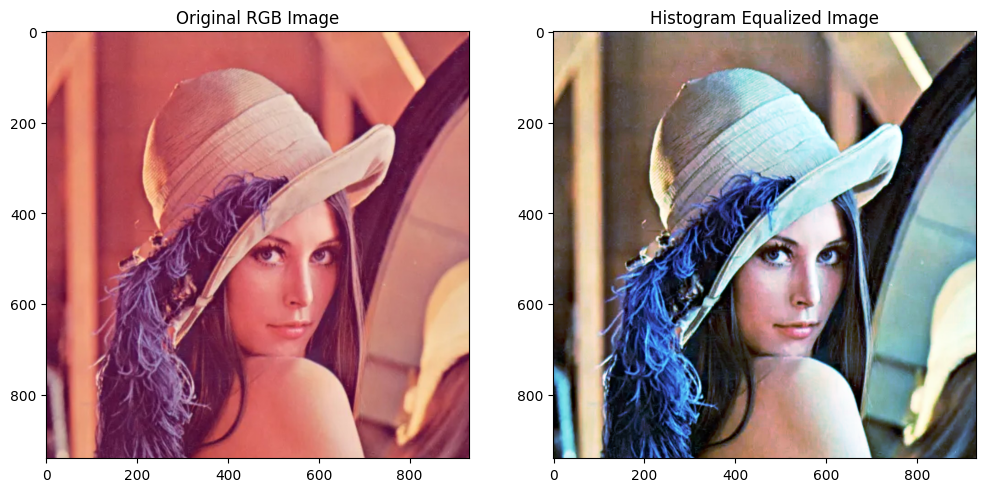

In [17]:
# Load the image
image_cv = cv2.imread("images/lena.jpg") 

# Convert BGR to RGB for correct visualization
image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)

# Split channels
red, green, blue = cv2.split(image_rgb)

# Apply Histogram Equalization to Each Color Channel
red_eq = cv2.equalizeHist(red)
green_eq = cv2.equalizeHist(green)
blue_eq = cv2.equalizeHist(blue)

# Merge Equalized Channels into an RGB Image
equalized_image = cv2.merge((red_eq, green_eq, blue_eq))

# Display original and equalized images
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(image_rgb)
axes[0].set_title("Original RGB Image")

axes[1].imshow(equalized_image)
axes[1].set_title("Histogram Equalized Image")

plt.show()


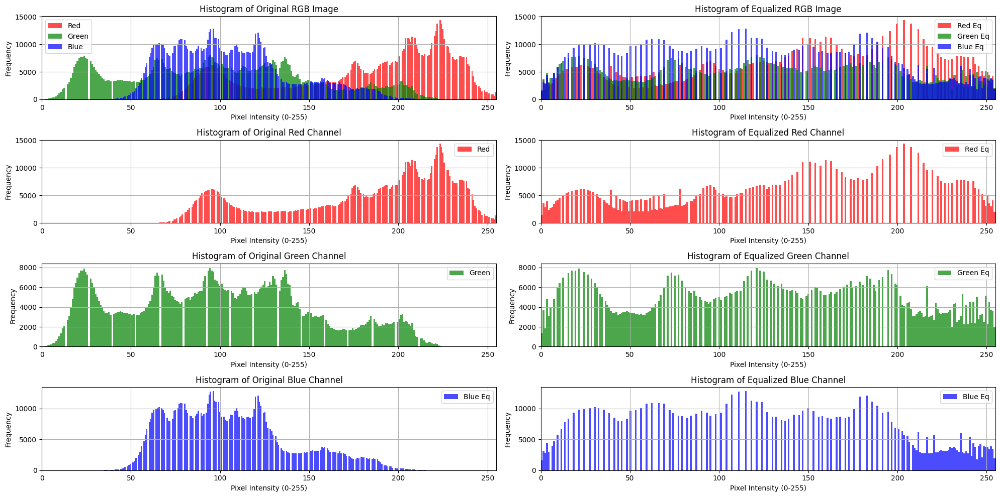

In [18]:
# Load the image in color (BGR format)
image_path = "images/lena.jpg"
image_bgr = cv2.imread(image_path)

# Convert BGR to RGB for correct visualization
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Split channels
red_channel, green_channel, blue_channel = cv2.split(image_rgb)

# Apply Histogram Equalization to Each Color Channel
red_eq = cv2.equalizeHist(red_channel)
green_eq = cv2.equalizeHist(green_channel)
blue_eq = cv2.equalizeHist(blue_channel)

# Merge Equalized Channels into an RGB Image
equalized_rgb = cv2.merge((red_eq, green_eq, blue_eq))

# Create histograms
hist_red, _ = np.histogram(red_channel.ravel(), bins=256, range=[0, 256])
hist_green, _ = np.histogram(green_channel.ravel(), bins=256, range=[0, 256])
hist_blue, _ = np.histogram(blue_channel.ravel(), bins=256, range=[0, 256])

hist_red_eq, _ = np.histogram(red_eq.ravel(), bins=256, range=[0, 256])
hist_green_eq, _ = np.histogram(green_eq.ravel(), bins=256, range=[0, 256])
hist_blue_eq, _ = np.histogram(blue_eq.ravel(), bins=256, range=[0, 256])

# Create subplots for original RGB image, histogram equalized RGB image, and their histograms
fig, axes = plt.subplots(4, 2, figsize=(20, 10))

# Display histograms of original image channels
axes[0, 0].hist(red_channel.ravel(), bins=256, color='red', alpha=0.7, label="Red")
axes[0, 0].hist(green_channel.ravel(), bins=256, color='green', alpha=0.7, label="Green")
axes[0, 0].hist(blue_channel.ravel(), bins=256, color='blue', alpha=0.7, label="Blue")
axes[0, 0].set_title("Histogram of Original RGB Image")
axes[0, 0].set_xlabel("Pixel Intensity (0-255)")
axes[0, 0].set_ylabel("Frequency")
axes[0, 0].set_xlim([0, 255])
axes[0, 0].legend()
axes[0, 0].grid()

# Display histograms of equalized image channels
axes[0, 1].hist(red_eq.ravel(), bins=256, color='red', alpha=0.7, label="Red Eq")
axes[0, 1].hist(green_eq.ravel(), bins=256, color='green', alpha=0.7, label="Green Eq")
axes[0, 1].hist(blue_eq.ravel(), bins=256, color='blue', alpha=0.7, label="Blue Eq")
axes[0, 1].set_title("Histogram of Equalized RGB Image")
axes[0, 1].set_xlabel("Pixel Intensity (0-255)")
axes[0, 1].set_ylabel("Frequency")
axes[0, 1].set_xlim([0, 255])
axes[0, 1].legend()
axes[0, 1].grid()


# Display histograms of original image channels
axes[1, 0].hist(red_channel.ravel(), bins=256, color='red', alpha=0.7, label="Red")
axes[1, 0].set_title("Histogram of Original Red Channel")
axes[1, 0].set_xlabel("Pixel Intensity (0-255)")
axes[1, 0].set_ylabel("Frequency")
axes[1, 0].set_xlim([0, 255])
axes[1, 0].legend()
axes[1, 0].grid()


# Display histograms of equalized image channels
axes[1, 1].hist(red_eq.ravel(), bins=256, color='red', alpha=0.7, label="Red Eq")
axes[1, 1].set_title("Histogram of Equalized Red Channel")
axes[1, 1].set_xlabel("Pixel Intensity (0-255)")
axes[1, 1].set_ylabel("Frequency")
axes[1, 1].set_xlim([0, 255])
axes[1, 1].legend()
axes[1, 1].grid()


# Display histograms of original image channels
axes[2, 0].hist(green_channel.ravel(), bins=256, color='green', alpha=0.7, label="Green")
axes[2, 0].set_title("Histogram of Original Green Channel")
axes[2, 0].set_xlabel("Pixel Intensity (0-255)")
axes[2, 0].set_ylabel("Frequency")
axes[2, 0].set_xlim([0, 255])
axes[2, 0].legend()
axes[2, 0].grid()

# Display histograms of equalized image channels
axes[2, 1].hist(green_eq.ravel(), bins=256, color='green', alpha=0.7, label="Green Eq")
axes[2, 1].set_title("Histogram of Equalized Green Channel")
axes[2, 1].set_xlabel("Pixel Intensity (0-255)")
axes[2, 1].set_ylabel("Frequency")
axes[2, 1].set_xlim([0, 255])
axes[2, 1].legend()
axes[2, 1].grid()

# Display histograms of original image channels
axes[3, 0].hist(blue_channel.ravel(), bins=256, color='blue', alpha=0.7, label="Blue Eq")
axes[3, 0].set_title("Histogram of Original Blue Channel")
axes[3, 0].set_xlabel("Pixel Intensity (0-255)")
axes[3, 0].set_ylabel("Frequency")
axes[3, 0].set_xlim([0, 255])
axes[3, 0].legend()
axes[3, 0].grid()


# Display histograms of equalized image channels
axes[3, 1].hist(blue_eq.ravel(), bins=256, color='blue', alpha=0.7, label="Blue Eq")
axes[3, 1].set_title("Histogram of Equalized Blue Channel")
axes[3, 1].set_xlabel("Pixel Intensity (0-255)")
axes[3, 1].set_ylabel("Frequency")
axes[3, 1].set_xlim([0, 255])
axes[3, 1].legend()
axes[3, 1].grid()

plt.tight_layout()
plt.show()


## CLAHE (Contrast Limited Adaptive Histogram Equalization) – Preserving Local Contrast

CLAHE (Contrast Limited Adaptive Histogram Equalization) is an improved version of histogram equalization that enhances image contrast without amplifying noise or overexposing bright regions.

### What is CLAHE?
1. CLAHE enhances local contrast, rather than applying equalization globally across the image.
2. It divides the image into small tiles and applies histogram equalization separately to each region.
3. Contrast is limited (clipped) to prevent over-enhancement and noise amplification.
   
### How Does CLAHE Work?
- Divides the image into small regions (tiles) → Each tile undergoes histogram equalization independently.
- Limits contrast amplification → Prevents over-brightening or excessive noise.
- Interpolates between neighboring tiles → Ensures smooth transitions across different parts of the image.

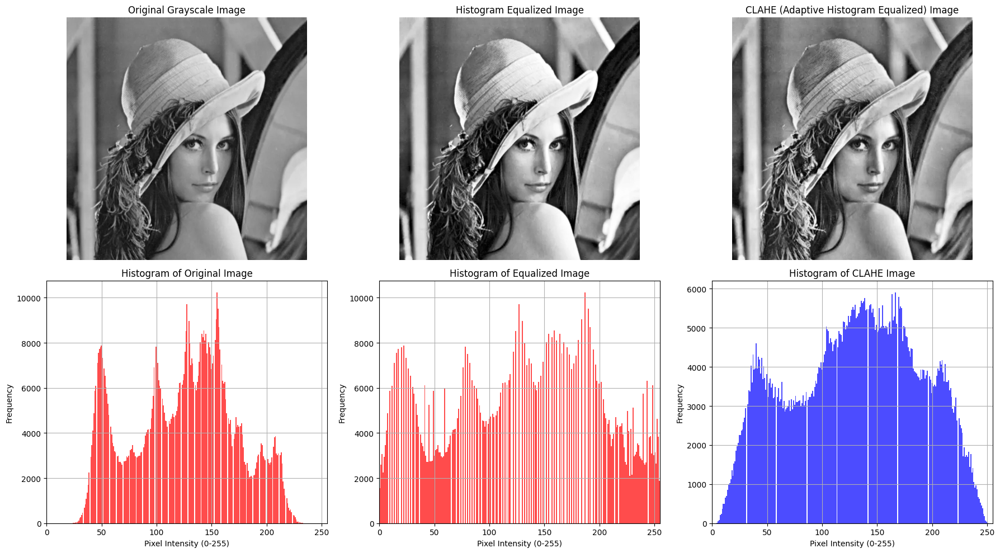

In [19]:
# Load the grayscale image
image_path = "images/lena.jpg"
gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Histogram Equalization
equalized_gray = cv2.equalizeHist(gray_image)

# Apply CLAHE (Adaptive Histogram Equalization)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_image = clahe.apply(gray_image)

# Create histograms
hist_equalized, _ = np.histogram(equalized_gray.ravel(), bins=256, range=[0, 256])
hist_clahe, _ = np.histogram(clahe_image.ravel(), bins=256, range=[0, 256])

# Create subplots for visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Display the original grayscale image
axes[0, 0].imshow(gray_image, cmap='gray')
axes[0, 0].set_title("Original Grayscale Image")
axes[0, 0].axis("off")

# Display the histogram equalized grayscale image
axes[0, 1].imshow(equalized_gray, cmap='gray')
axes[0, 1].set_title("Histogram Equalized Image")
axes[0, 1].axis("off")

# Display the CLAHE-enhanced grayscale image
axes[0, 2].imshow(clahe_image, cmap='gray')
axes[0, 2].set_title("CLAHE (Adaptive Histogram Equalized) Image")
axes[0, 2].axis("off")

# Display histogram of the histogram-equalized grayscale image
axes[1, 0].hist(gray_image.ravel(), bins=256, color='red', alpha=0.7)
axes[1, 0].set_title("Histogram of Original Image")
axes[1, 0].set_xlabel("Pixel Intensity (0-255)")
axes[1, 0].set_ylabel("Frequency")
axes[1, 0].set_xlim([0, 255])
axes[1, 0].grid()

# Display histogram of the histogram-equalized grayscale image
axes[1, 1].hist(equalized_gray.ravel(), bins=256, color='red', alpha=0.7)
axes[1, 1].set_title("Histogram of Equalized Image")
axes[1, 1].set_xlabel("Pixel Intensity (0-255)")
axes[1, 1].set_ylabel("Frequency")
axes[1, 1].set_xlim([0, 255])
axes[1, 1].grid()

# Display histogram of the CLAHE-enhanced grayscale image
axes[1, 2].hist(clahe_image.ravel(), bins=256, color='blue', alpha=0.7)
axes[1, 2].set_title("Histogram of CLAHE Image")
axes[1, 2].set_xlabel("Pixel Intensity (0-255)")
axes[1, 2].set_ylabel("Frequency")
axes[1, 2].set_xlim([0, 255])
axes[1, 2].grid()

plt.tight_layout()
plt.show()


1. Original Grayscale Image → The original input image in grayscale.
2. Histogram Equalized Image → Uses global histogram equalization, which can sometimes over-enhance or lose local details.
3. CLAHE (Adaptive Histogram Equalized) Image → Improves local contrast while avoiding over-enhancement, making it ideal for medical imaging, face detection, and satellite imagery.
   


### Why Use CLAHE Instead of Standard Histogram Equalization?
| Feature | **Standard Histogram Equalization** | **CLAHE (Adaptive Histogram Equalization)** |
|---------|----------------------------------|------------------------------------------|
| **Contrast Enhancement** | Global (applies to the entire image) | Local (applies to small regions) |
| **Risk of Over-enhancement** | High (may cause extreme brightness) | Low (controlled contrast) |
| **Works Well for Uniform Images?** | Yes | Yes |
| **Works Well for Unevenly Lit Images?** | No (overexposes bright areas) | Yes (preserves local details) |
| **Amplifies Noise?** | Yes, especially in dark areas | No, due to contrast limiting |

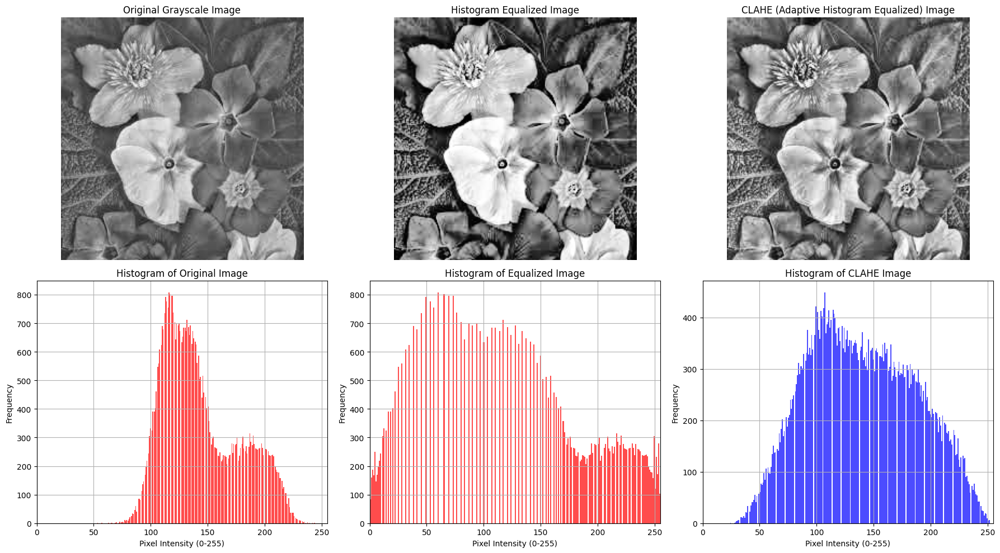

In [20]:
# Load the grayscale image
image_path = "images/contrast_streching.jpeg"
gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Histogram Equalization
equalized_gray = cv2.equalizeHist(gray_image)

# Apply CLAHE (Adaptive Histogram Equalization)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
clahe_image = clahe.apply(gray_image)

# Create histograms
hist_equalized, _ = np.histogram(equalized_gray.ravel(), bins=256, range=[0, 256])
hist_clahe, _ = np.histogram(clahe_image.ravel(), bins=256, range=[0, 256])

# Create subplots for visualization
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Display the original grayscale image
axes[0, 0].imshow(gray_image, cmap='gray')
axes[0, 0].set_title("Original Grayscale Image")
axes[0, 0].axis("off")

# Display the histogram equalized grayscale image
axes[0, 1].imshow(equalized_gray, cmap='gray')
axes[0, 1].set_title("Histogram Equalized Image")
axes[0, 1].axis("off")

# Display the CLAHE-enhanced grayscale image
axes[0, 2].imshow(clahe_image, cmap='gray')
axes[0, 2].set_title("CLAHE (Adaptive Histogram Equalized) Image")
axes[0, 2].axis("off")

# Display histogram of the histogram-equalized grayscale image
axes[1, 0].hist(gray_image.ravel(), bins=256, color='red', alpha=0.7)
axes[1, 0].set_title("Histogram of Original Image")
axes[1, 0].set_xlabel("Pixel Intensity (0-255)")
axes[1, 0].set_ylabel("Frequency")
axes[1, 0].set_xlim([0, 255])
axes[1, 0].grid()

# Display histogram of the histogram-equalized grayscale image
axes[1, 1].hist(equalized_gray.ravel(), bins=256, color='red', alpha=0.7)
axes[1, 1].set_title("Histogram of Equalized Image")
axes[1, 1].set_xlabel("Pixel Intensity (0-255)")
axes[1, 1].set_ylabel("Frequency")
axes[1, 1].set_xlim([0, 255])
axes[1, 1].grid()

# Display histogram of the CLAHE-enhanced grayscale image
axes[1, 2].hist(clahe_image.ravel(), bins=256, color='blue', alpha=0.7)
axes[1, 2].set_title("Histogram of CLAHE Image")
axes[1, 2].set_xlabel("Pixel Intensity (0-255)")
axes[1, 2].set_ylabel("Frequency")
axes[1, 2].set_xlim([0, 255])
axes[1, 2].grid()

plt.tight_layout()
plt.show()


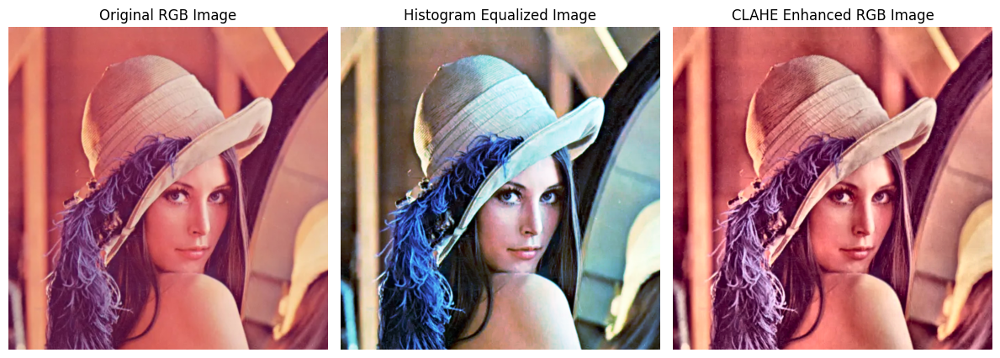

In [21]:
# Load the original color image (BGR format)
image_path = "images/lena.jpg"
image_bgr = cv2.imread(image_path)

# Convert BGR to RGB for original visualization
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

red, green, blue = cv2.split(image_rgb)

# Apply Histogram Equalization to Each Color Channel
red_eq = cv2.equalizeHist(red)
green_eq = cv2.equalizeHist(green)
blue_eq = cv2.equalizeHist(blue)

# Merge Equalized Channels into an RGB Image
equalized_image = cv2.merge((red_eq, green_eq, blue_eq))

# Convert BGR to LAB color space (for applying CLAHE)
image_lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)

# Split LAB channels (L=Lightness, A & B=Color information)
l_channel, a_channel, b_channel = cv2.split(image_lab)

# Apply CLAHE on the Lightness channel only (L channel)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
l_channel_clahe = clahe.apply(l_channel)

# Merge the CLAHE-processed L-channel back with A & B channels
image_lab_clahe = cv2.merge((l_channel_clahe, a_channel, b_channel))

# Convert LAB back to RGB
image_rgb_clahe = cv2.cvtColor(image_lab_clahe, cv2.COLOR_LAB2RGB)

# Create subplots for visualization
fig, axes = plt.subplots(1, 3, figsize=(12, 5))

# Display the original RGB image
axes[0].imshow(image_rgb)
axes[0].set_title("Original RGB Image")
axes[0].axis("off")

# Display the Histogram-enhanced RGB image
axes[1].imshow(equalized_image)
axes[1].set_title("Histogram Equalized Image")
axes[1].axis("off")

# Display the CLAHE-enhanced RGB image
axes[2].imshow(image_rgb_clahe)
axes[2].set_title("CLAHE Enhanced RGB Image")
axes[2].axis("off")


# Show the plots
plt.tight_layout()
plt.show()


## Difference Between Applying Histogram Equalization on RGB vs. LAB Images
Histogram equalization enhances contrast, but applying it directly on RGB images vs. LAB images gives very different results. This is because of how color spaces handle brightness and color components.

### What Happens?
1 Each channel (Red, Green, Blue) is separately equalized.
2 This leads to color distortion because histogram equalization modifies brightness differently across channels.
3 The resulting image may look unnatural with altered colors.

### Why Is This a Problem?
If one channel (e.g., Red) has more intensity values, it gets stretched more than the other channels.
This results in unnatural shifts in hue and saturation, making the image appear unrealistic.


## Applying Histogram Equalization on LAB Image

### What Happens?
1. In the LAB color space, the L (Lightness) channel stores brightness information, while the A & B channels store color information.
2. Histogram equalization is applied only to the L-channel, leaving the color information unchanged.
3. The result is contrast enhancement without altering colors.
   
### Why Is This Better?
1. Since only the brightness is modified, the image retains natural colors.
2. It prevents unwanted hue shifts and preserves color balance.
3. Commonly used in medical imaging, face enhancement, and satellite images.

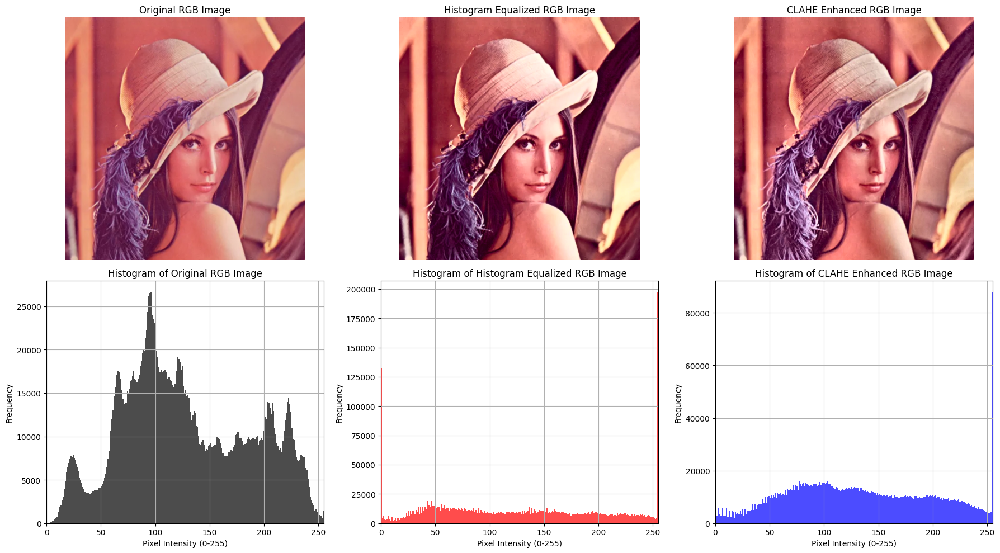

In [22]:
# Load the original color image (BGR format)
image_path = "images/lena.jpg"
image_bgr = cv2.imread(image_path)

# Convert BGR to LAB color space (for applying CLAHE and Histogram Equalization)
image_lab = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2LAB)

# Split LAB channels (L=Lightness, A & B=Color information)
l_channel, a_channel, b_channel = cv2.split(image_lab)

# Apply CLAHE on the Lightness channel (L channel)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
l_channel_clahe = clahe.apply(l_channel)

# Apply standard Histogram Equalization on Lightness channel
l_channel_eq = cv2.equalizeHist(l_channel)

# Merge the CLAHE-processed L-channel back with A & B channels
image_lab_clahe = cv2.merge((l_channel_clahe, a_channel, b_channel))

# Merge the Histogram Equalized L-channel back with A & B channels
image_lab_eq = cv2.merge((l_channel_eq, a_channel, b_channel))

# Convert LAB back to RGB
image_rgb_clahe = cv2.cvtColor(image_lab_clahe, cv2.COLOR_LAB2RGB)
image_rgb_eq = cv2.cvtColor(image_lab_eq, cv2.COLOR_LAB2RGB)

# Convert BGR to RGB for original visualization
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Compute histograms for each image
hist_original, _ = np.histogram(image_rgb.ravel(), bins=256, range=[0, 256])
hist_equalized, _ = np.histogram(image_rgb_eq.ravel(), bins=256, range=[0, 256])
hist_clahe, _ = np.histogram(image_rgb_clahe.ravel(), bins=256, range=[0, 256])

# Create subplots for original, histogram equalized, and CLAHE-enhanced images with their histograms
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

# Display the original RGB image
axes[0, 0].imshow(image_rgb)
axes[0, 0].set_title("Original RGB Image")
axes[0, 0].axis("off")

# Display the Histogram Equalized RGB image
axes[0, 1].imshow(image_rgb_eq)
axes[0, 1].set_title("Histogram Equalized RGB Image")
axes[0, 1].axis("off")

# Display the CLAHE-enhanced RGB image
axes[0, 2].imshow(image_rgb_clahe)
axes[0, 2].set_title("CLAHE Enhanced RGB Image")
axes[0, 2].axis("off")

# Display histogram of the original RGB image
axes[1, 0].hist(image_rgb.ravel(), bins=256, color='black', alpha=0.7)
axes[1, 0].set_title("Histogram of Original RGB Image")
axes[1, 0].set_xlabel("Pixel Intensity (0-255)")
axes[1, 0].set_ylabel("Frequency")
axes[1, 0].set_xlim([0, 255])
axes[1, 0].grid()

# Display histogram of the Histogram Equalized RGB image
axes[1, 1].hist(image_rgb_eq.ravel(), bins=256, color='red', alpha=0.7)
axes[1, 1].set_title("Histogram of Histogram Equalized RGB Image")
axes[1, 1].set_xlabel("Pixel Intensity (0-255)")
axes[1, 1].set_ylabel("Frequency")
axes[1, 1].set_xlim([0, 255])
axes[1, 1].grid()

# Display histogram of the CLAHE-enhanced RGB image
axes[1, 2].hist(image_rgb_clahe.ravel(), bins=256, color='blue', alpha=0.7)
axes[1, 2].set_title("Histogram of CLAHE Enhanced RGB Image")
axes[1, 2].set_xlabel("Pixel Intensity (0-255)")
axes[1, 2].set_ylabel("Frequency")
axes[1, 2].set_xlim([0, 255])
axes[1, 2].grid()

# Show the plots
plt.tight_layout()
plt.show()


## Visual Comparison 
| **Feature** | **Histogram Equalization on RGB** | **Histogram Equalization on LAB (L-Channel Only)** |
|------------|---------------------------------|--------------------------------------|
| **Contrast Enhancement** |  Yes |  Yes | 
| **Color Preservation** |  No (Colors change due to per-channel processing) |  Yes (Colors remain natural) | 
| **Hue & Saturation Stability** |  No (May create unnatural hues) |  Yes (Only brightness is modified) | 
| **Best For** | General images, but not recommended | Face images, medical images, satellite images |

## Black and white Image

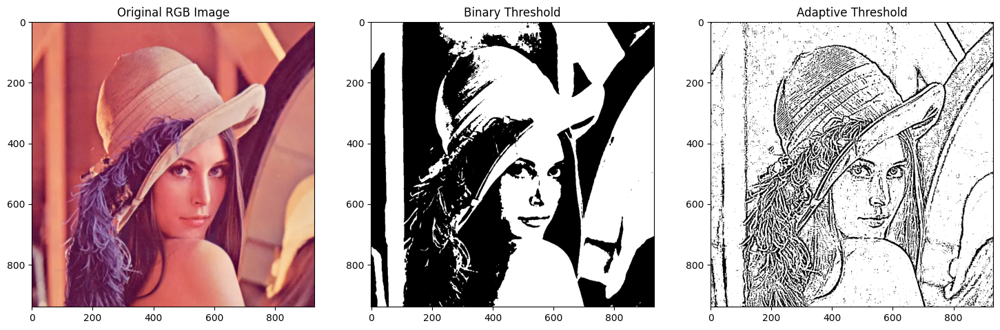

In [34]:
# Load the grayscale image
image_path = "images/lena.jpg"
gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Binary Thresholding
_, binary = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY)

# Adaptive Thresholding
adaptive_thresh = cv2.adaptiveThreshold(gray_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                       cv2.THRESH_BINARY, 11, 2)

# Display results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Display the original RGB image
axes[0].imshow(image_rgb)
axes[0].set_title("Original RGB Image")

axes[1].imshow(binary, cmap='gray')
axes[1].set_title("Binary Threshold")

axes[2].imshow(adaptive_thresh, cmap='gray')
axes[2].set_title("Adaptive Threshold")
plt.show()

## Basic Image Operations

### How Computers Process Images

### Image Representation in Python
- **OpenCV (cv2)** represents images as **NumPy arrays**.
- **Pillow (PIL)** represents images as **objects**.

### Color Spaces
- **RGB (Red-Green-Blue)**: Standard color format.
- **BGR (Blue-Green-Red)**: OpenCV’s default format.
- **HSV (Hue-Saturation-Value)**: Used in color-based object detection.
- **Grayscale**: Only contains intensity values.


# Understanding HSV Color Space in Image Processing

**HSV** stands for **Hue, Saturation, and Value (Brightness)**.  
It is an alternative to the **RGB color model**, commonly used in **computer vision** and **color-based object detection** because it better represents how humans perceive colors.

---

## What is HSV?

| Component  | Description                                      | Range in OpenCV |
|------------|------------------------------------------------|----------------|
| **Hue (H)**   | Represents the color type (e.g., Red, Green, Blue, Yellow). | 0 - 179 |
| **Saturation (S)** | Represents the intensity or purity of the color. | 0 - 255 |
| **Value (V)** | Represents the brightness of the color. | 0 - 255 |

---

## Why Use HSV Instead of RGB?

**Separates color (H) from intensity (V)**: Unlike RGB, where brightness affects all channels, HSV allows **color selection independent of lighting conditions**.  

**Better for color-based object detection**:  
Example: **Detecting a yellow ball in different lighting** is easier in HSV than in RGB.  

**More intuitive for human vision**: Colors are easier to define using **Hue** rather than mixing Red, Green, and Blue.

## Convert an Image from BGR to HSV in OpenCV

Since OpenCV loads images in **BGR format**, we convert it to **HSV** as follows:


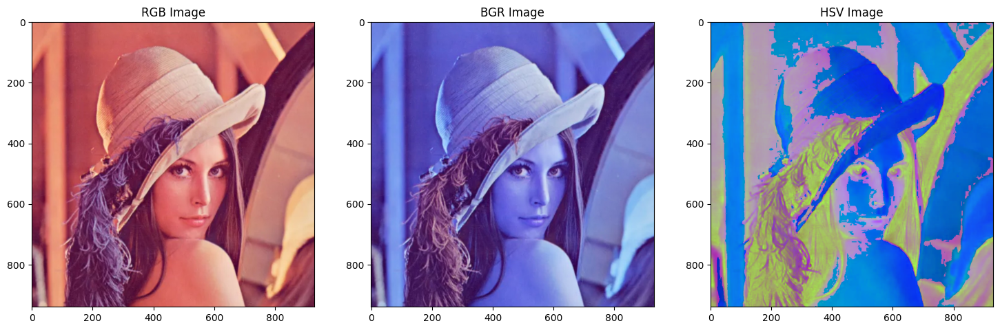

In [24]:
# load Image
image_cv = cv2.imread('images/harry.jpg')
image_cv = cv2.imread('images/lena.jpg')

# Convert to RGB
image_rgb = cv2.cvtColor(image_cv, cv2.COLOR_BGR2RGB)

# Convert to HSV
hsv_image = cv2.cvtColor(image_cv, cv2.COLOR_BGR2HSV)

# Display images
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(image_rgb)
axes[0].set_title("RGB Image")

axes[1].imshow(image_cv, cmap='gray')
axes[1].set_title("BGR Image")

axes[2].imshow(hsv_image)
axes[2].set_title("HSV Image")


plt.show()


## How to Correctly Visualize HSV Components?
To correctly visualize Hue, Saturation, and Value separately:

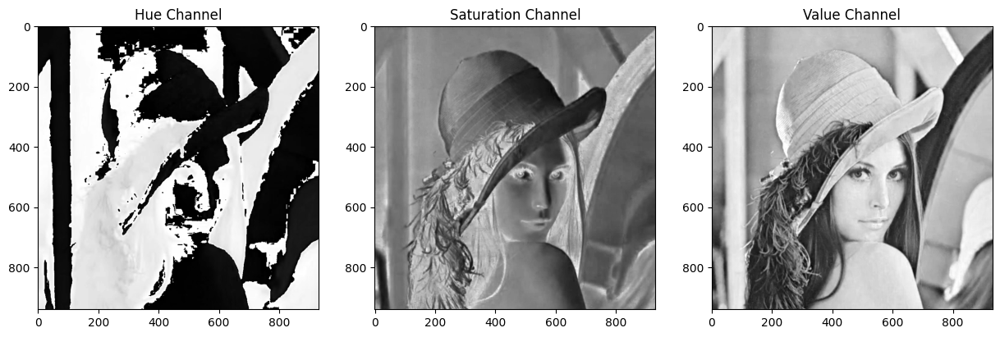

In [25]:
# Split HSV channels
hue, saturation, value = cv2.split(hsv_image)

# Display the HSV channels separately
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(hue, cmap='gray')
axes[0].set_title("Hue Channel")

axes[1].imshow(saturation, cmap='gray')
axes[1].set_title("Saturation Channel")

axes[2].imshow(value, cmap='gray')
axes[2].set_title("Value Channel")

plt.show()


# Why Artists and Designers Love HSV

Unlike RGB, which mixes primary colors, **HSV works like a painter’s color wheel**!  
Artists prefer HSV because adjusting **Hue** gives different colors **without affecting brightness or intensity**.  

Example:  
- If you want **different shades of red**, you change the **Saturation**.  
- If you want a **lighter red**, you increase the **Value (brightness)**.


## HSV is Used in Color-Based Object Detection & Augmented Reality

- **HSV is the secret behind Snapchat & Instagram filters!**
- When an app detects your **face, eyes, or lips**, it often uses **HSV** to track specific colors (e.g., skin tones).
- **Traffic light detection** in self-driving cars works by analyzing **Hue & Saturation** in an image.


## Example: Detecting Red Objects


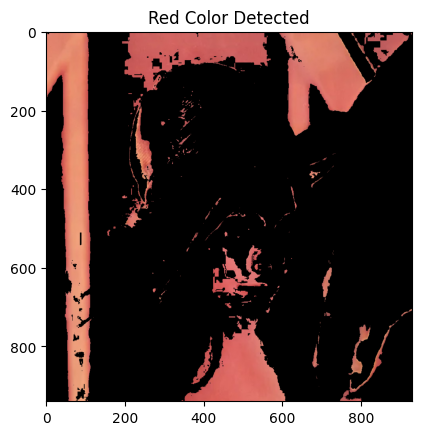

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image = cv2.imread("images/lena.jpg")
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define range for red color in HSV
lower_red = np.array([0, 120, 70])  # Lower boundary (Hue, Saturation, Value)
upper_red = np.array([10, 255, 255])  # Upper boundary

# Threshold the image to extract only red colors
mask = cv2.inRange(hsv, lower_red, upper_red)
result = cv2.bitwise_and(image, image, mask=mask)

# Convert BGR to RGB for correct visualization
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)

# Display results
plt.imshow(result_rgb)
plt.title("Red Color Detected")
plt.show()


# HSV is Used in Night Vision Cameras & Military Tech

- **Night vision** works by converting **infrared light** into the **HSV color spectrum**.
- The **military** uses **HSV-based segmentation** to track **heat signatures** in thermal cameras.

# HSV is More Powerful Than You Thought!

1. **Used in AR filters, object tracking, and Snapchat lenses**
2.  **Essential for self-driving cars & facial recognition**
3.  **NASA & space telescopes use it for galaxy analysis**
4.  **Used in thermal imaging for night vision**
5.  **Can create trippy, color-shifting effects in seconds!**  


# HSV vs. RGB – Differences

HSV and RGB are two different ways to represent colors in digital images.  
While **RGB** is based on **mixing primary colors**, **HSV** separates **color, intensity, and brightness**, making it more useful in many real-world applications.

## Feature Comparison: HSV vs. RGB

| **Feature**            | **HSV (Hue, Saturation, Value)** | **RGB (Red, Green, Blue)** |
|------------------------|---------------------------------|---------------------------|
| **Color Representation** | Uses hue (color), saturation (purity), and value (brightness). | Uses red, green, and blue to create colors. |
| **Human Perception** | Matches how humans see colors (intuitive). | Based on physical light mixing (less intuitive). |
| **Brightness Control** | Value (V) channel controls brightness separately. | Brightness changes affect all three channels (R, G, B). |
| **Color Adjustment** | Easy to modify hue to change color. | Adjusting colors requires tweaking all three channels. |
| **Best Used For** | Color detection, segmentation, object tracking, image enhancement. | Screen displays, computer graphics, blending images. |
| **Background Changes** | Works well under changing lighting conditions. | Sensitive to lighting variations. |
| **Thresholding & Masking** | Works well for isolating colors (e.g., detecting a red ball). | Harder to apply thresholding directly. |
| **Performance in Object Tracking** | More robust as color is separated from light intensity. | Not ideal as lighting affects RGB colors directly. |
| **Example Use Case** | Used in self-driving cars, augmented reality, image segmentation. | Used in digital screens, image blending, color correction. |

# Visualizing HSV vs. RGB Components
HSV separates colors in a way that makes it easier to analyze hue, saturation, and brightness independently.



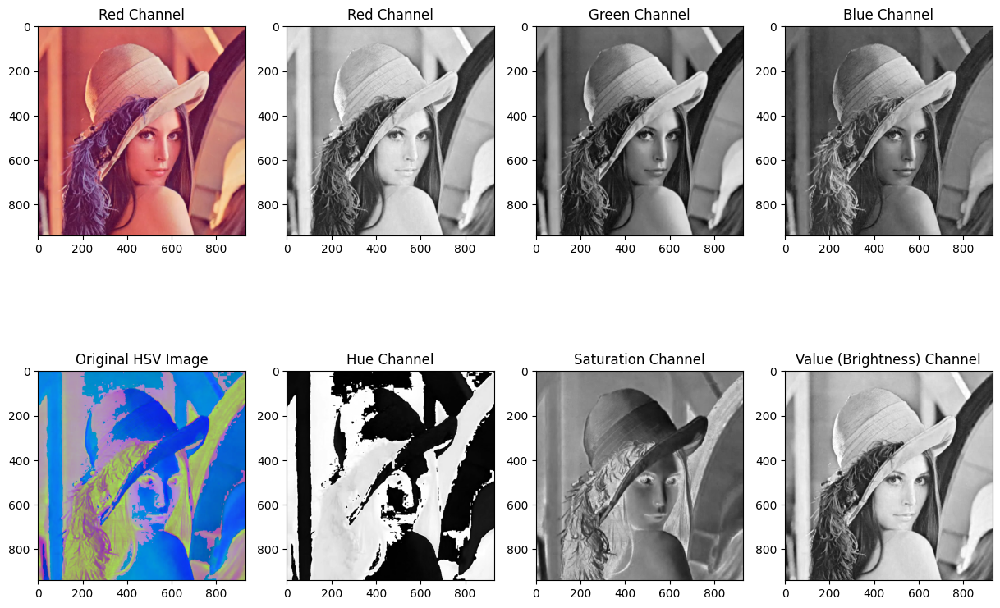

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load an image
image = cv2.imread("images/lena.jpg")  

# Convert to HSV and RGB
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Split channels
h, s, v = cv2.split(image_hsv)
r, g, b = cv2.split(image_rgb)

# Display RGB vs. HSV channels
fig, axes = plt.subplots(2, 4, figsize=(15, 10))

axes[0, 0].imshow(image_rgb)
axes[0, 0].set_title("Red Channel")

axes[0, 1].imshow(r, cmap='gray')
axes[0, 1].set_title("Red Channel")

axes[0, 2].imshow(g, cmap='gray')
axes[0, 2].set_title("Green Channel")

axes[0, 3].imshow(b, cmap='gray')
axes[0, 3].set_title("Blue Channel")

axes[1, 0].imshow(image_hsv, cmap='gray')
axes[1, 0].set_title("Original HSV Image")

axes[1, 1].imshow(h, cmap='gray')
axes[1, 1].set_title("Hue Channel")

axes[1, 2].imshow(s, cmap='gray')
axes[1, 2].set_title("Saturation Channel")

axes[1, 3].imshow(v, cmap='gray')
axes[1, 3].set_title("Value (Brightness) Channel")

plt.show()


## Image Preprocessing Techniques

### Basic Image Operations

### Resizing & Cropping
- **Resizing** is used to standardize images for processing.
- **Cropping** extracts a **region of interest**.

### Image Rotation & Flipping
- **Rotation**: 90°, 180°.
- **Flipping**: Horizontal, Vertical.


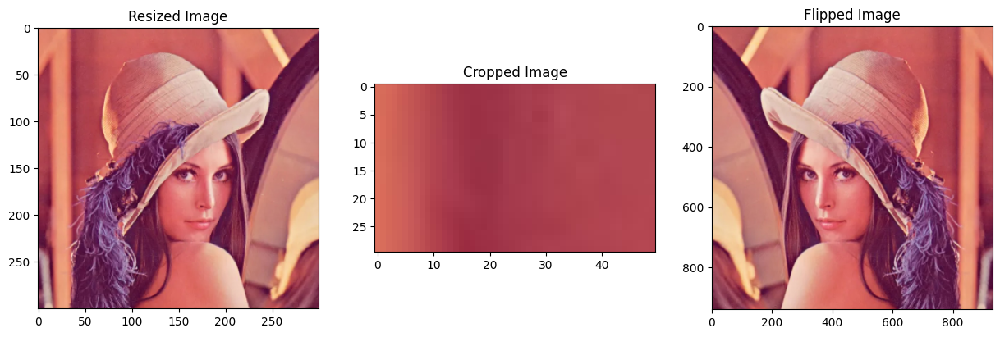

In [28]:
# Resize Image
resized_image = cv2.resize(image_rgb, (300, 300))

# Crop Image (Extract a region)
crop_image = image_rgb[70:100, 100:150]  # Crop from x=50, y=50 to x=200, y=200

# Flip Image
flipped_image = cv2.flip(image_rgb, 1)  # Flip Horizontally

# Display results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(resized_image)
axes[0].set_title("Resized Image")

axes[1].imshow(crop_image)
axes[1].set_title("Cropped Image")

axes[2].imshow(flipped_image)
axes[2].set_title("Flipped Image")
plt.show()


## Image Filtering and Smoothing
Image filtering is a fundamental technique in image processing that helps in:
1. **Reducing noise**  
2. **Enhancing important structures**  
3. **Blurring or sharpening** images for better analysis  

## Why Is Image Filtering Important?
- **Real-world images contain noise and artifacts** due to lighting conditions, compression, or sensor imperfections.  
- **Filtering techniques help clean images** before applying edge detection, segmentation, or object recognition.  

## Types of Image Filtering
Image filtering can be categorized into:  

### Low-Pass Filtering (Blurring)
1. **Purpose**: Removes noise by averaging nearby pixels, making images smoother.  
2. **Use Cases**: Preprocessing for edge detection, reducing small details, background smoothing.  

![Salt and Pepper Noise](images/saltpeppernoise.png)

**Read the article regarding the above image Noise Reduction Technique**
[Article: A salt and pepper noise image denoising method based on the generative classification](https://link.springer.com/article/10.1007/s11042-018-6732-8)

**Common Techniques:**
- **Gaussian Blur** → Preserves edges while smoothing noise.  
- **Median Blur** → Best for salt-and-pepper noise removal.  
- **Bilateral Filter** → Preserves edges while reducing noise.  


### High-Pass Filtering (Sharpening)
1. **Purpose**: Enhances edges and details by **amplifying high-frequency components**.  
2. **Use Cases**: Enhancing textures, sharpening blurry images, improving object boundaries.  

**Common Techniques:**
- **Laplacian Filter** → Highlights edges and transitions in intensity.  
- **Unsharp Masking** → Enhances fine details by subtracting a blurred version from the original.  

### Edge Detection Filters
1. **Purpose**: Detects edges in an image by identifying sudden intensity changes.  
2. **Use Cases**: Used in object detection, facial recognition, and feature extraction.  

**Common Techniques:**
- **Sobel Filter** → Detects edges in horizontal/vertical directions.  
- **Laplacian Operator** → Captures second-order intensity changes.  
- **Canny Edge Detection** → A multi-stage algorithm that produces clear, thin edges.


## 1. Low-Pass Filtering (Blurring)

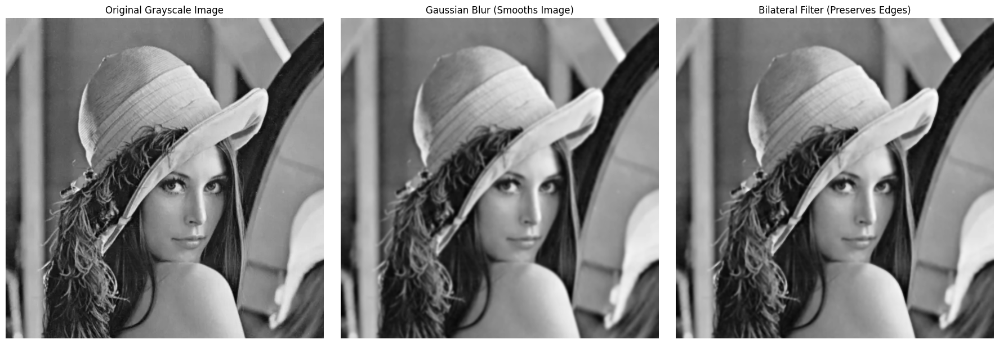

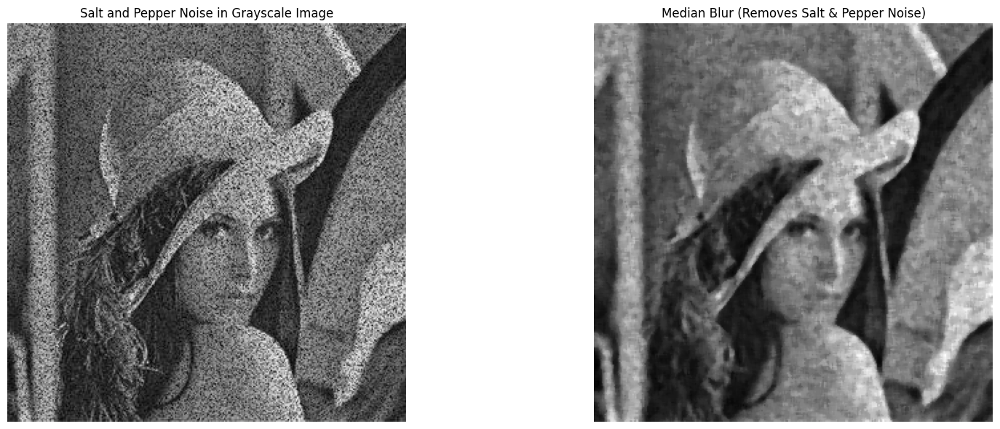

In [29]:
# Reload the grayscale image
image_path = "images/lena.jpg"
gray_image = cv2.imread("images/lena.jpg", cv2.IMREAD_GRAYSCALE)

# --- LOW-PASS FILTERING (BLURRING) --- #
gaussian_blur = cv2.GaussianBlur(gray_image, (15, 15), 0)  # Smoothens image while preserving edges
median_blur = cv2.medianBlur(cv2.imread("images/saltandpepperlena.jpg", cv2.IMREAD_GRAYSCALE), 5)  # Best for salt-and-pepper noise removal
bilateral_filter = cv2.bilateralFilter(gray_image, 9, 75, 75)  # Preserves edges while reducing noise

# Create subplots for Low-Pass Filtering visualization
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title("Original Grayscale Image")
axes[0].axis("off")

axes[1].imshow(gaussian_blur, cmap='gray')
axes[1].set_title("Gaussian Blur (Smooths Image)")
axes[1].axis("off")

axes[2].imshow(bilateral_filter, cmap='gray')
axes[2].set_title("Bilateral Filter (Preserves Edges)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
axes[0].imshow(cv2.imread("images/saltandpepperlena.jpg", cv2.IMREAD_GRAYSCALE), cmap='gray')
axes[0].set_title("Salt and Pepper Noise in Grayscale Image")
axes[0].axis("off")

axes[1].imshow(median_blur, cmap='gray')
axes[1].set_title("Median Blur (Removes Salt & Pepper Noise)")
axes[1].axis("off")

plt.tight_layout()
plt.show()

### Output:
1. **Gaussian Blur** → Smooths the image while **preserving overall structure**.  
2. **Median Blur** → Removes **salt-and-pepper noise** by replacing each pixel with the median value.  
3. **Bilateral Filter** → Smooths noise **without losing edge details**, making it better for **faces and natural images**. 


## 2. High-Pass Filtering (Sharpening)

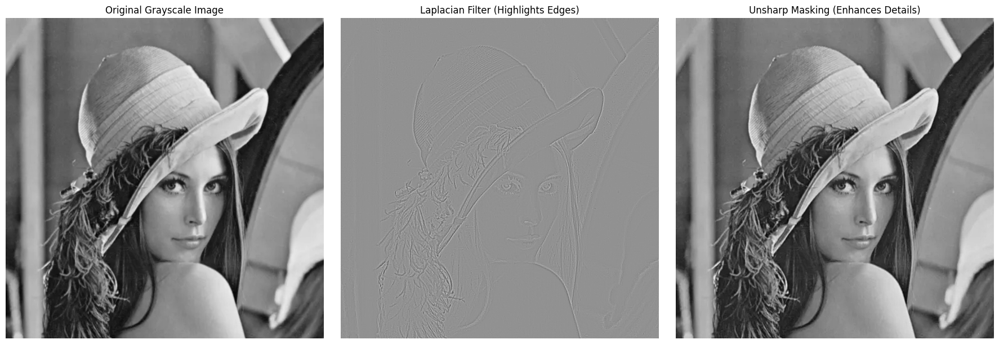

In [37]:
# --- HIGH-PASS FILTERING (SHARPENING) --- #
laplacian_filter = cv2.Laplacian(gray_image, cv2.CV_64F)  # Highlights rapid intensity changes
unsharp_mask = cv2.addWeighted(gray_image, 1.5, gaussian_blur, -0.5, 0)  # Enhances details

# Create subplots for High-Pass Filtering visualization
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title("Original Grayscale Image")
axes[0].axis("off")

axes[1].imshow(laplacian_filter, cmap='gray')
axes[1].set_title("Laplacian Filter (Highlights Edges)")
axes[1].axis("off")

axes[2].imshow(unsharp_mask, cmap='gray')
axes[2].set_title("Unsharp Masking (Enhances Details)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

#### Output:
1. **Laplacian Filter** → Highlights **edges and fine details** by computing second derivatives.  
2. **Unsharp Masking** → Enhances edges and **restores sharpness** by subtracting a blurred version from the original.
## 3. Edge Detection

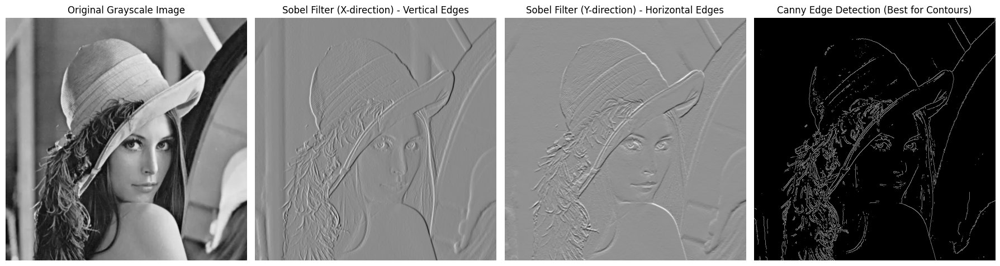

In [31]:
# --- EDGE DETECTION FILTERS --- #
sobel_x = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=5)  # Detects vertical edges
sobel_y = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=5)  # Detects horizontal edges
canny_edges = cv2.Canny(gray_image, 100, 100)  # Best for clear and accurate edge detection

# Create subplots for Edge Detection visualization
fig, axes = plt.subplots(1, 4, figsize=(18, 6))
axes[0].imshow(gray_image, cmap='gray')
axes[0].set_title("Original Grayscale Image")
axes[0].axis("off")

axes[1].imshow(sobel_x, cmap='gray')
axes[1].set_title("Sobel Filter (X-direction) - Vertical Edges")
axes[1].axis("off")

axes[2].imshow(sobel_y, cmap='gray')
axes[2].set_title("Sobel Filter (Y-direction) - Horizontal Edges")
axes[2].axis("off")

axes[3].imshow(canny_edges, cmap='gray')
axes[3].set_title("Canny Edge Detection (Best for Contours)")
axes[3].axis("off")

plt.tight_layout()
plt.show()

#### Output:
1. **Sobel (X-direction)** → Detects **vertical edges** (left-to-right changes).  
2. **Sobel (Y-direction)** → Detects **horizontal edges** (top-to-bottom changes).  
3. **Canny Edge Detection** → Extracts **clear and well-defined contours** using gradient changes.  

## Morphological Operations
Morphological operations are a set of techniques used for shape-based transformations in an image. They are primarily used in binary and grayscale images for:  Noise removal
1. Object segmentation
2. Shape analysis
3. Edge enhancement

## Why Are Morphological Operations Important?
- Helps refine object boundaries by removing noise, filling gaps, or emphasizing structures.
- Commonly used in image pre-processing before object detection, OCR (Optical Character Recognition), and medical imaging.
- Works well on binary images (black-and-white images) where objects need to be extracted.

## Types of Morphological Operations
### Dilation
- Adds pixels to object boundaries, expanding bright regions in binary images.
- Use Case: Filling small gaps in shapes and connecting broken parts.

### Erosion
- Removes pixels from object boundaries, shrinking bright regions.
- Use Case: Removing small noise or separating objects that are touching.

### Opening (Erosion followed by Dilation)
- Removes small noise while maintaining object shape.
- Use Case: Used for removing speckle noise from images.

### Closing (Dilation followed by Erosion)
- Fills small holes in objects while keeping overall structure intact.
- Use Case: Used for filling small gaps in text or objects.

### Morphological Gradient
- Finds the difference between Dilation and Erosion to highlight edges.
- Use Case: Useful for edge detection and feature extraction.

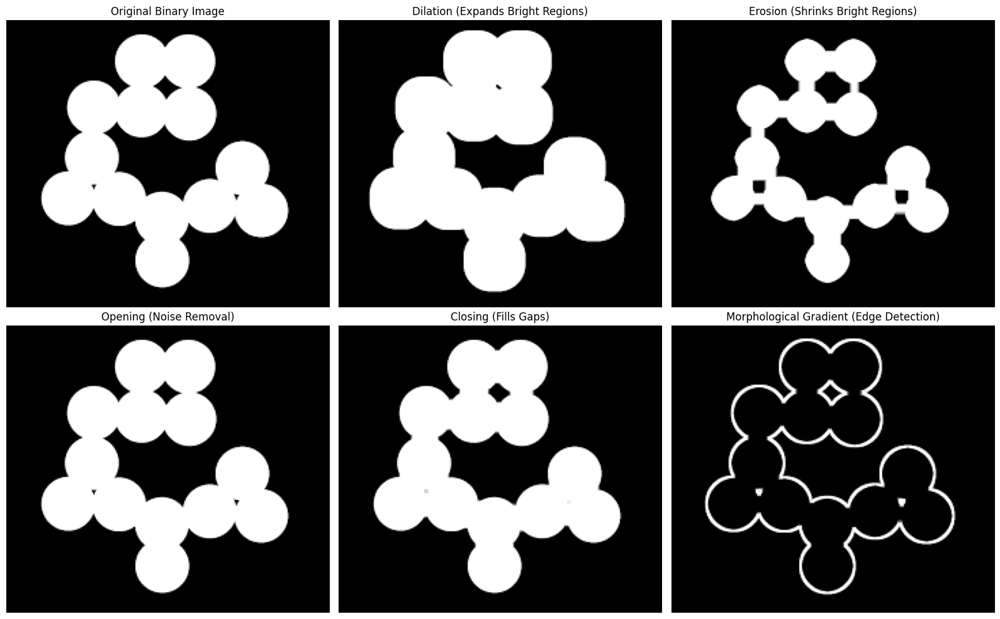

In [38]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the fingerprint image in grayscale
# image_path = "images/finger.jpg"
# gray_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
# Convert to binary using thresholding
# _, binary_image = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY_INV)

# Load Binary Image directly
image_path = "images/mp.png"
binary_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Define kernel for morphological operations
kernel = np.ones((3, 3), np.uint8)

# Apply morphological operations
dilated = cv2.dilate(binary_image, kernel, iterations=3)
eroded = cv2.erode(binary_image, kernel, iterations=3)
opened = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)
closed = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)
gradient = cv2.morphologyEx(binary_image, cv2.MORPH_GRADIENT, kernel)

# Create subplots for visualization
fig, axes = plt.subplots(2, 3, figsize=(16, 10))

axes[0, 0].imshow(binary_image, cmap='gray')
axes[0, 0].set_title("Original Binary Image")
axes[0, 0].axis("off")

axes[0, 1].imshow(dilated, cmap='gray')
axes[0, 1].set_title("Dilation (Expands Bright Regions)")
axes[0, 1].axis("off")

axes[0, 2].imshow(eroded, cmap='gray')
axes[0, 2].set_title("Erosion (Shrinks Bright Regions)")
axes[0, 2].axis("off")

axes[1, 0].imshow(opened, cmap='gray')
axes[1, 0].set_title("Opening (Noise Removal)")
axes[1, 0].axis("off")

axes[1, 1].imshow(closed, cmap='gray')
axes[1, 1].set_title("Closing (Fills Gaps)")
axes[1, 1].axis("off")

axes[1, 2].imshow(gradient, cmap='gray')
axes[1, 2].set_title("Morphological Gradient (Edge Detection)")
axes[1, 2].axis("off")

plt.tight_layout()
plt.show()


## Region-Based Segmentation

Region-based segmentation is a **top-down image segmentation technique** that groups neighboring pixels into regions **based on predefined similarity criteria**, such as intensity, color, or texture.

## What is Region-Based Segmentation?
Instead of identifying boundaries directly (like edge detection), region-based segmentation:
- Starts with **seed points**
- Grows those regions by **merging neighboring pixels** with similar characteristics
- Ends when **no further pixels meet the criteria**

### Types of Region-Based Techniques

| Method | Description |
|--------|-------------|
| **Region Growing** | Starts from a seed pixel and adds neighboring pixels if they are similar. |
| **Region Splitting** | Recursively splits an image into quadrants until all pixels in a region are similar. |
| **Region Merging** | Opposite of splitting: merges adjacent regions with similar characteristics. |
| **Split-and-Merge** | Combines both splitting and merging. |


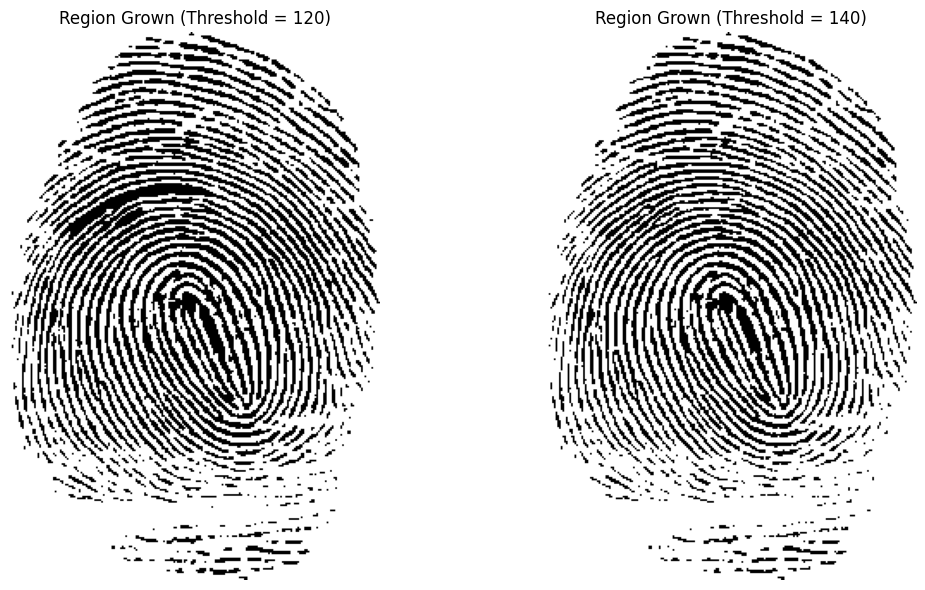

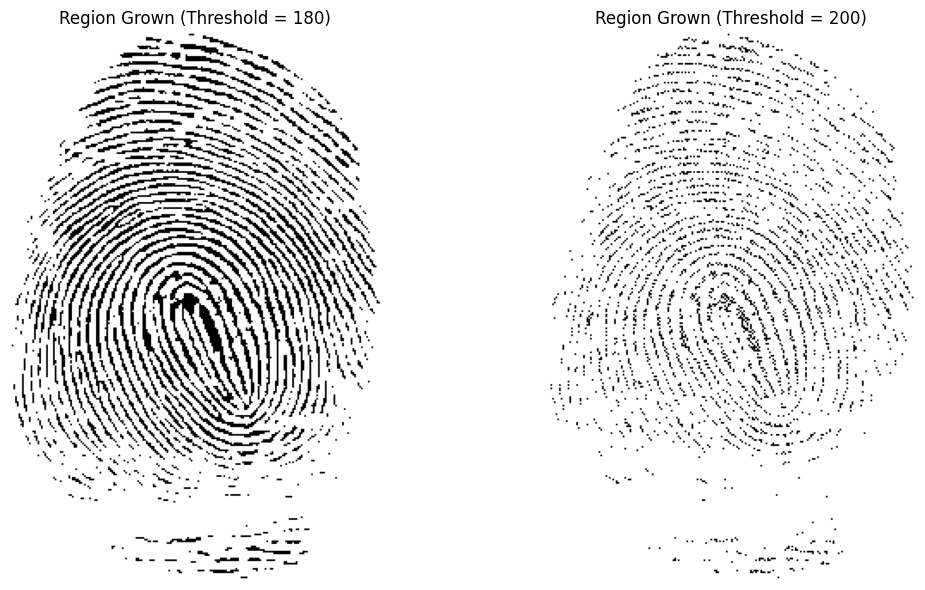

In [63]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import deque

def region_growing(img, seed_point, threshold=5):
    height, width = img.shape
    segmented = np.zeros_like(img, dtype=np.uint8)
    visited = np.zeros_like(img, dtype=bool)
    
    seed_value = img[seed_point]
    queue = deque([seed_point])
    segmented[seed_point] = 255
    visited[seed_point] = True

    while queue:
        y, x = queue.popleft()
        for j in range(-1, 2):
            for i in range(-1, 2):
                ny, nx = y + j, x + i
                if (0 <= ny < height) and (0 <= nx < width) and not visited[ny, nx]:
                    if abs(int(img[ny, nx]) - int(seed_value)) < threshold:
                        segmented[ny, nx] = 255
                        queue.append((ny, nx))
                    visited[ny, nx] = True

    return segmented

# Load and convert the image to grayscale
image = cv2.imread("images/finger.jpg", cv2.IMREAD_GRAYSCALE)

# Choose a seed point manually (y, x) near the center of a bright region
seed = (100, 100)

# Apply Region Growing
segmented_output1 = region_growing(image, seed, threshold=180)
segmented_output2= region_growing(image, seed, threshold=200)
segmented_output3= region_growing(image, seed, threshold=120)
segmented_output4= region_growing(image, seed, threshold=140)

# Display results

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(segmented_output3, cmap='gray')
plt.title("Region Grown (Threshold = 120)")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_output4, cmap='gray')
plt.title("Region Grown (Threshold = 140)")
plt.axis('off')

plt.tight_layout()
plt.show()


plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(segmented_output1, cmap='gray')
plt.title("Region Grown (Threshold = 180)")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_output2, cmap='gray')
plt.title("Region Grown (Threshold = 200)")
plt.axis('off')

plt.tight_layout()
plt.show()




### Explanation of Parameters

- **`seed_point`**: Starting pixel for region growing.
- **`threshold`**: How different a neighboring pixel's intensity can be to be included.
- **`segmented_output`**: Final binary mask showing the grown region.


### Use Cases
- **Medical Imaging** – isolate tumors or organs.
- **Fingerprint & Palmprint Analysis** – extract ridges or patterns.
- **Satellite Images** – detect land, water, and forest regions.

## Feature Extraction in Image Processing

**Feature extraction** is the process of detecting **distinctive and informative parts** of an image—such as edges, corners, textures, or patterns—that can be used for:
- **Object detection**
- **Image matching**
- **Face recognition**
- **Image classification**


## Common Feature Extraction Techniques:

| Technique | Description |
|----------|-------------|
| **Edge Detection** | Detects boundaries of objects (e.g., Sobel, Canny) |
| **Corner Detection** | Finds points where edges meet (e.g., Harris, Shi-Tomasi) |
| **Keypoint Detectors & Descriptors** | Detects & describes local patterns (e.g., SIFT, ORB, SURF) |


We'll demonstrate **Harris Corner Detection** and **ORB (Oriented FAST and Rotated BRIEF)**—both are widely used.

### Harris Corner Detection

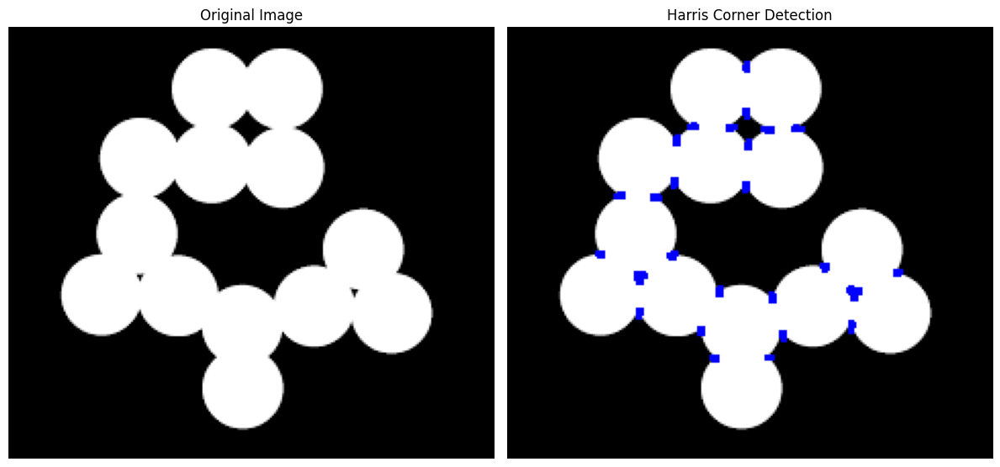

In [74]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load Lena image in grayscale
image = cv2.imread("images/mp.png")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Harris Corner Detection
gray_float = np.float32(gray)
dst = cv2.cornerHarris(gray_float, blockSize=2, ksize=3, k=0.04)
dst = cv2.dilate(dst, None)  # enhance corner visibility

# Mark corners on the image
corner_image = image.copy()
corner_image[dst > 0.01 * dst.max()] = [0, 0, 255]

# Display
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
# plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.imshow(image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
# plt.imshow(cv2.cvtColor(corner_image, cv2.COLOR_BGR2RGB))
plt.imshow(corner_image)
plt.title("Harris Corner Detection")
plt.axis("off")
plt.tight_layout()
plt.show()

### ORB Feature Detection (FAST keypoints + BRIEF descriptors)

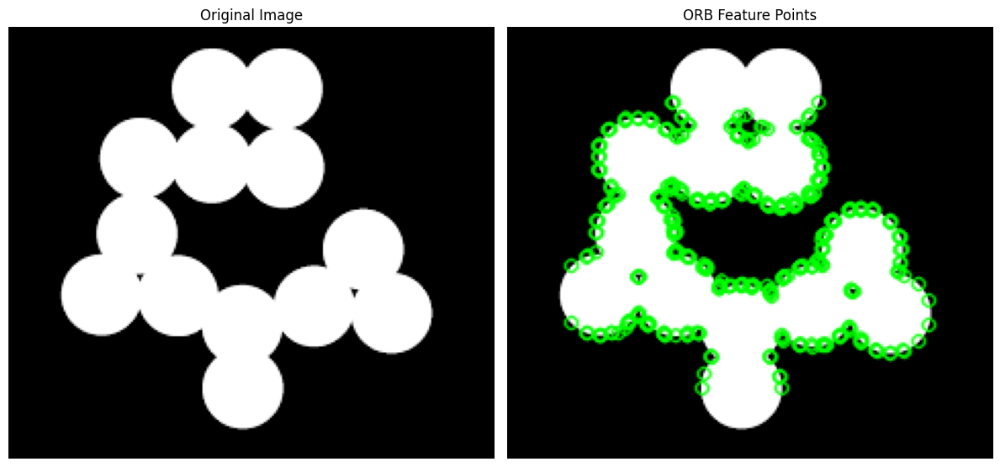

In [76]:
# Load Lena image in grayscale
image = cv2.imread("images/mp.png")

# ORB Detector
orb = cv2.ORB_create()

# Detect keypoints and descriptors
keypoints, descriptors = orb.detectAndCompute(gray, None)

# Draw keypoints
orb_image = cv2.drawKeypoints(image, keypoints, None, color=(0, 255, 0), flags=0)


# Display
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
# plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.imshow(image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
# plt.imshow(cv2.cvtColor(orb_image, cv2.COLOR_BGR2RGB))
plt.imshow(orb_image)
plt.title("ORB Feature Points")
plt.axis("off")
plt.tight_layout()
plt.show()

## Explanation

| Feature | Harris | ORB |
|--------|--------|-----|
| Detects | Corners | Keypoints (Corners + Edges) |
| Descriptor | None | Yes (Rotation invariant, binary) |
| Use Case | Simple detection | Image matching, recognition |
| Speed | Fast | Very Fast (real-time) |


### Applications of Feature Extraction
- **Facial recognition**
- **Medical image analysis**
- **Autonomous vehicles**
- **Image stitching (panorama)**





---
### Blob Detection in Image Processing

**Blob Detection** refers to finding regions in an image that are **uniform in intensity** and **different from surrounding areas**—like blobs!

These **blobs can be spots, regions, or patterns** that are useful for:
- **Object tracking**
- **Keypoint detection**
- **Medical imaging**
- **Biometric recognition (iris, fingerprint blobs)**

## Popular Blob Detection Technique: **SimpleBlobDetector in OpenCV**

It detects **circular or blob-like structures** based on:
- Area  
- Circularity  
- Convexity  
- Inertia  

### Blob Detection Code (Using Lena or Any Image)

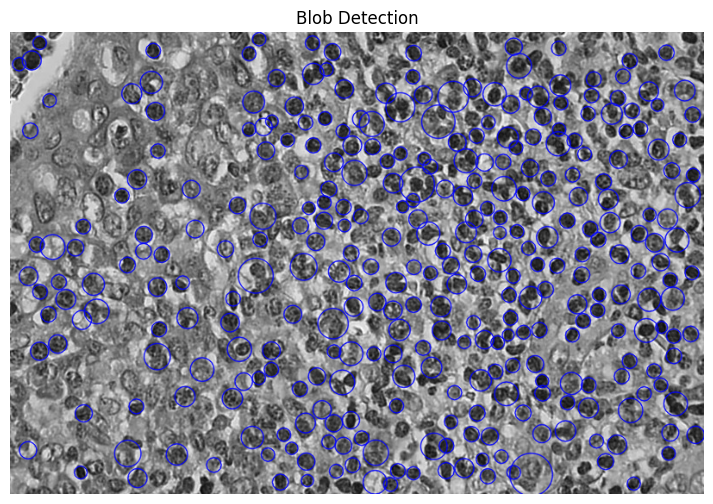

In [81]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image in grayscale
image = cv2.imread("images/blob2.png", cv2.IMREAD_GRAYSCALE)

# Set up the blob detector with default parameters
params = cv2.SimpleBlobDetector_Params()

# Change thresholds (optional)
params.minThreshold = 10
params.maxThreshold = 200

# Filter by Area
params.filterByArea = True
params.minArea = 150

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.1

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.5

# Filter by Inertia
params.filterByInertia = True
params.minInertiaRatio = 0.1

# Create a detector with the parameters
detector = cv2.SimpleBlobDetector_create(params)

# Detect blobs
keypoints = detector.detect(image)

# Draw detected blobs as red circles
blob_image = cv2.drawKeypoints(
    image, keypoints, np.array([]),
    (0, 0, 255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
)

# Display
plt.figure(figsize=(10, 6))
plt.imshow(blob_image, cmap='gray')
plt.title("Blob Detection")
plt.axis("off")
plt.show()

## What the Code Does:

- Converts image to grayscale  
- Initializes **SimpleBlobDetector** with filtering rules  
- Detects blobs (regions with intensity or shape differences)  
- Displays blobs using red circular markers  

## When to Use Blob Detection?

| Application Area | Use Case |
|------------------|----------|
| Medical Imaging | Detect cells, tumors, lesions |
| Computer Vision | Detect coins, pupils, buttons |
| Robotics | Track features or markers |
| Industrial | Detect defects, round objects |
